# Problem Statement:

Business case:
Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.

In this project, we are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 

In this example, we shall be working with some auto insurance data to demonstrate how we can create a predictive model that predicts if an insurance claim is fraudulent or not.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings 
warnings.simplefilter("ignore")
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv')
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [3]:
# target column is fraud_reported which has 2 values Y and N. Hence, it is a binary classification problem.

In [4]:
df.shape

(1000, 40)

In [5]:
df= df.drop_duplicates()

In [6]:
df.shape

(1000, 40)

In [7]:
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In [8]:
# Checking number of unique values in each column
df.nunique()

months_as_customer              391
age                              46
policy_number                  1000
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    4
incident_severity                 4
authorities_contacted             5
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage             

In [9]:
# There are no null values except for column _c39 which has all null values
#lets drop _c39 column

In [10]:
df = df.drop(["_c39"],axis=1)

In [11]:
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,1,?,87200,17440,8720,61040,Honda,Accord,2006,N
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


In [12]:
df.nunique().to_frame("Unique values")

,Unique values
months_as_customer,391
age,46
policy_number,1000
policy_bind_date,951
policy_state,3
policy_csl,3
policy_deductable,3
policy_annual_premium,991
umbrella_limit,11
insured_zip,995


In [13]:
# The columns policy_number and incident_location have all unique values. lets drop them too

In [14]:
#Droping policy_number and incident_location column

df = df.drop(["policy_number"],axis=1)
df = df.drop(["incident_location"],axis=1)

In [15]:
df

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,16-07-1991,OH,500/1000,1000,1310.80,0,431289,FEMALE,...,1,?,87200,17440,8720,61040,Honda,Accord,2006,N
996,285,41,05-01-2014,IL,100/300,1000,1436.79,0,608177,FEMALE,...,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N
997,130,34,17-02-2003,OH,250/500,500,1383.49,3000000,442797,FEMALE,...,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
998,458,62,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,MALE,...,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


In [16]:
# Checking null values again 
df.isnull().sum()

months_as_customer             0
age                            0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_cla

In [17]:
# We can see there no null values so we are good to proceed further!

In [18]:
df.dtypes

months_as_customer               int64
age                              int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage          

In [19]:
# list. of object data types:

object_datatypes=[]
for x in df.dtypes.index:
    if df.dtypes[x]=='object':
        object_datatypes.append(x)
object_datatypes

['policy_bind_date',
 'policy_state',
 'policy_csl',
 'insured_sex',
 'insured_education_level',
 'insured_occupation',
 'insured_hobbies',
 'insured_relationship',
 'incident_date',
 'incident_type',
 'collision_type',
 'incident_severity',
 'authorities_contacted',
 'incident_state',
 'incident_city',
 'property_damage',
 'police_report_available',
 'auto_make',
 'auto_model',
 'fraud_reported']

In [20]:
# list of numerical data types:

numerical_datatypes=[]
for x in df.dtypes.index:
    if df.dtypes[x]!= 'object':
      numerical_datatypes.append(x)
numerical_datatypes

['months_as_customer',
 'age',
 'policy_deductable',
 'policy_annual_premium',
 'umbrella_limit',
 'insured_zip',
 'capital-gains',
 'capital-loss',
 'incident_hour_of_the_day',
 'number_of_vehicles_involved',
 'bodily_injuries',
 'witnesses',
 'total_claim_amount',
 'injury_claim',
 'property_claim',
 'vehicle_claim',
 'auto_year']

In [21]:
# Feature Engineering

In [22]:
df

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,16-07-1991,OH,500/1000,1000,1310.80,0,431289,FEMALE,...,1,?,87200,17440,8720,61040,Honda,Accord,2006,N
996,285,41,05-01-2014,IL,100/300,1000,1436.79,0,608177,FEMALE,...,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N
997,130,34,17-02-2003,OH,250/500,500,1383.49,3000000,442797,FEMALE,...,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
998,458,62,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,MALE,...,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


In [23]:
# Irreleavant columns:

# policy_bind_date is not required as we have months_as_customer, how old is policy
# insured_zip is not required as we have policy_state and many mored details for insured like sex,education,hobby,occupation,relationship   

In [24]:
df = df.drop(["policy_bind_date", "insured_zip"],axis=1)

In [25]:
df

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,OH,250/500,1000,1406.91,0,MALE,MD,craft-repair,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,IN,250/500,2000,1197.22,5000000,MALE,MD,machine-op-inspct,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,OH,100/300,2000,1413.14,5000000,FEMALE,PhD,sales,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,IL,250/500,2000,1415.74,6000000,FEMALE,PhD,armed-forces,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,IL,500/1000,1000,1583.91,6000000,MALE,Associate,sales,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,500/1000,1000,1310.80,0,FEMALE,Masters,craft-repair,...,1,?,87200,17440,8720,61040,Honda,Accord,2006,N
996,285,41,IL,100/300,1000,1436.79,0,FEMALE,PhD,prof-specialty,...,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N
997,130,34,OH,250/500,500,1383.49,3000000,FEMALE,Masters,armed-forces,...,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
998,458,62,IL,500/1000,2000,1356.92,5000000,MALE,Associate,handlers-cleaners,...,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


In [26]:
#By taking policy_csl column lets extract two other columns.
#Extracting columns from policy_csl

df['csl_per_person'] = df.policy_csl.str.split('/', expand=True)[0]
df['csl_per_accident'] = df.policy_csl.str.split('/', expand=True)[1]

In [27]:
df

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,csl_per_person,csl_per_accident
0,328,48,OH,250/500,1000,1406.91,0,MALE,MD,craft-repair,...,71610,6510,13020,52080,Saab,92x,2004,Y,250,500
1,228,42,IN,250/500,2000,1197.22,5000000,MALE,MD,machine-op-inspct,...,5070,780,780,3510,Mercedes,E400,2007,Y,250,500
2,134,29,OH,100/300,2000,1413.14,5000000,FEMALE,PhD,sales,...,34650,7700,3850,23100,Dodge,RAM,2007,N,100,300
3,256,41,IL,250/500,2000,1415.74,6000000,FEMALE,PhD,armed-forces,...,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,250,500
4,228,44,IL,500/1000,1000,1583.91,6000000,MALE,Associate,sales,...,6500,1300,650,4550,Accura,RSX,2009,N,500,1000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,500/1000,1000,1310.80,0,FEMALE,Masters,craft-repair,...,87200,17440,8720,61040,Honda,Accord,2006,N,500,1000
996,285,41,IL,100/300,1000,1436.79,0,FEMALE,PhD,prof-specialty,...,108480,18080,18080,72320,Volkswagen,Passat,2015,N,100,300
997,130,34,OH,250/500,500,1383.49,3000000,FEMALE,Masters,armed-forces,...,67500,7500,7500,52500,Suburu,Impreza,1996,N,250,500
998,458,62,IL,500/1000,2000,1356.92,5000000,MALE,Associate,handlers-cleaners,...,46980,5220,5220,36540,Audi,A5,1998,N,500,1000


In [28]:
df.dtypes

months_as_customer               int64
age                              int64
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage                 object
bodily_injuries                  int64
witnesses                

In [29]:
# policy_csl was object type data before now i have to convert extracted data from object to int dtype.

In [30]:
#Changing dtype of extracted column
df[['csl_per_person']] = df[['csl_per_person']].astype('int64')
df[['csl_per_accident']] = df[['csl_per_accident']].astype('int64')

In [31]:
df.dtypes

months_as_customer               int64
age                              int64
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage                 object
bodily_injuries                  int64
witnesses                

In [32]:
#Droping policy_csl column after extraction

df = df.drop(["policy_csl"],axis=1)

In [33]:
df

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,csl_per_person,csl_per_accident
0,328,48,OH,1000,1406.91,0,MALE,MD,craft-repair,sleeping,...,71610,6510,13020,52080,Saab,92x,2004,Y,250,500
1,228,42,IN,2000,1197.22,5000000,MALE,MD,machine-op-inspct,reading,...,5070,780,780,3510,Mercedes,E400,2007,Y,250,500
2,134,29,OH,2000,1413.14,5000000,FEMALE,PhD,sales,board-games,...,34650,7700,3850,23100,Dodge,RAM,2007,N,100,300
3,256,41,IL,2000,1415.74,6000000,FEMALE,PhD,armed-forces,board-games,...,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,250,500
4,228,44,IL,1000,1583.91,6000000,MALE,Associate,sales,board-games,...,6500,1300,650,4550,Accura,RSX,2009,N,500,1000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,1000,1310.80,0,FEMALE,Masters,craft-repair,paintball,...,87200,17440,8720,61040,Honda,Accord,2006,N,500,1000
996,285,41,IL,1000,1436.79,0,FEMALE,PhD,prof-specialty,sleeping,...,108480,18080,18080,72320,Volkswagen,Passat,2015,N,100,300
997,130,34,OH,500,1383.49,3000000,FEMALE,Masters,armed-forces,bungie-jumping,...,67500,7500,7500,52500,Suburu,Impreza,1996,N,250,500
998,458,62,IL,2000,1356.92,5000000,MALE,Associate,handlers-cleaners,base-jumping,...,46980,5220,5220,36540,Audi,A5,1998,N,500,1000


In [34]:
df.nunique().to_frame("Unique values")

,Unique values
months_as_customer,391
age,46
policy_state,3
policy_deductable,3
policy_annual_premium,991
umbrella_limit,11
insured_sex,2
insured_education_level,7
insured_occupation,14
insured_hobbies,20


In [35]:
df.dtypes

months_as_customer               int64
age                              int64
policy_state                    object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage                 object
bodily_injuries                  int64
witnesses                        int64
police_report_available  

In [36]:
# list. of object data types:

object_datatypes=[]
for x in df.dtypes.index:
    if df.dtypes[x]=='object':
        object_datatypes.append(x)
object_datatypes

['policy_state',
 'insured_sex',
 'insured_education_level',
 'insured_occupation',
 'insured_hobbies',
 'insured_relationship',
 'incident_date',
 'incident_type',
 'collision_type',
 'incident_severity',
 'authorities_contacted',
 'incident_state',
 'incident_city',
 'property_damage',
 'police_report_available',
 'auto_make',
 'auto_model',
 'fraud_reported']

In [37]:
# list of numerical data types:

numerical_datatypes=[]
for x in df.dtypes.index:
    if df.dtypes[x]!= 'object':
      numerical_datatypes.append(x)
numerical_datatypes

['months_as_customer',
 'age',
 'policy_deductable',
 'policy_annual_premium',
 'umbrella_limit',
 'capital-gains',
 'capital-loss',
 'incident_hour_of_the_day',
 'number_of_vehicles_involved',
 'bodily_injuries',
 'witnesses',
 'total_claim_amount',
 'injury_claim',
 'property_claim',
 'vehicle_claim',
 'auto_year',
 'csl_per_person',
 'csl_per_accident']

In [38]:
# EDA and Visualization

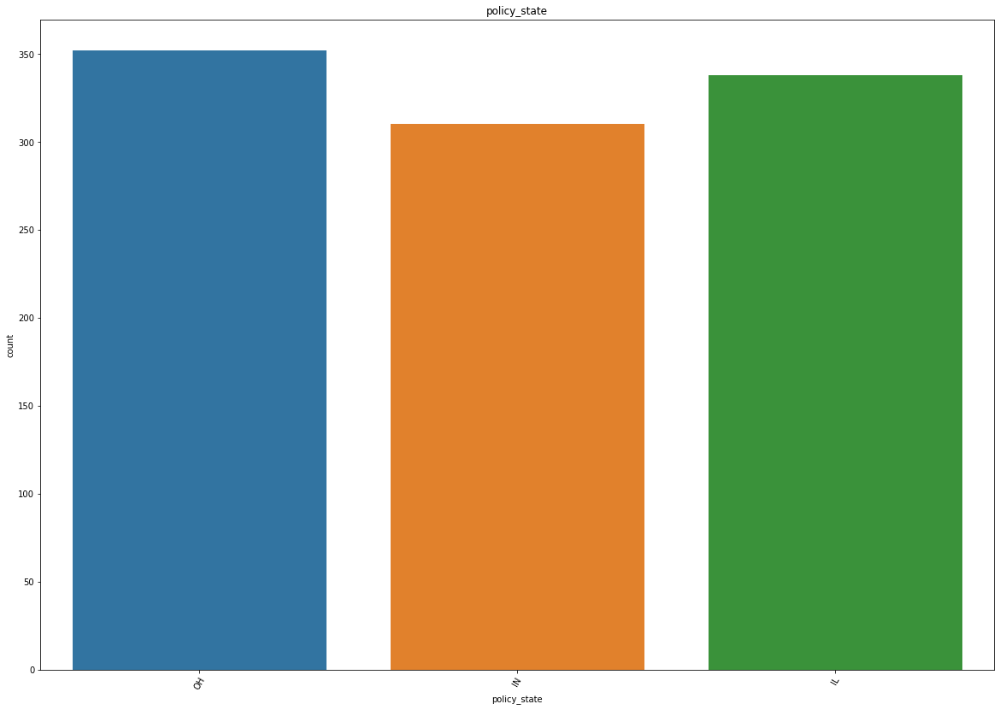

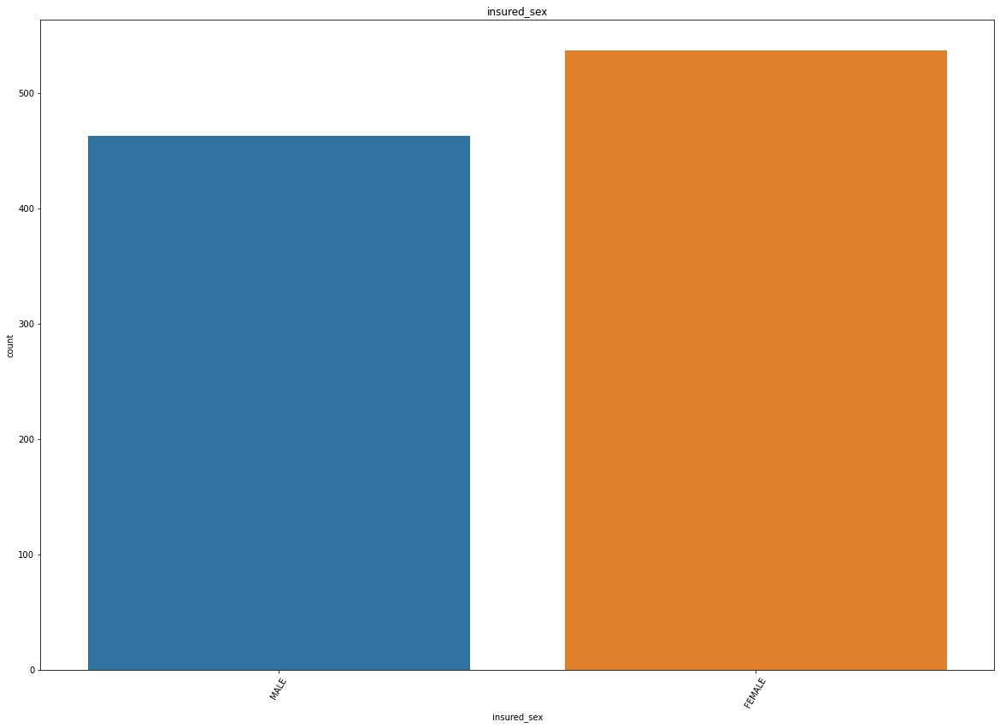

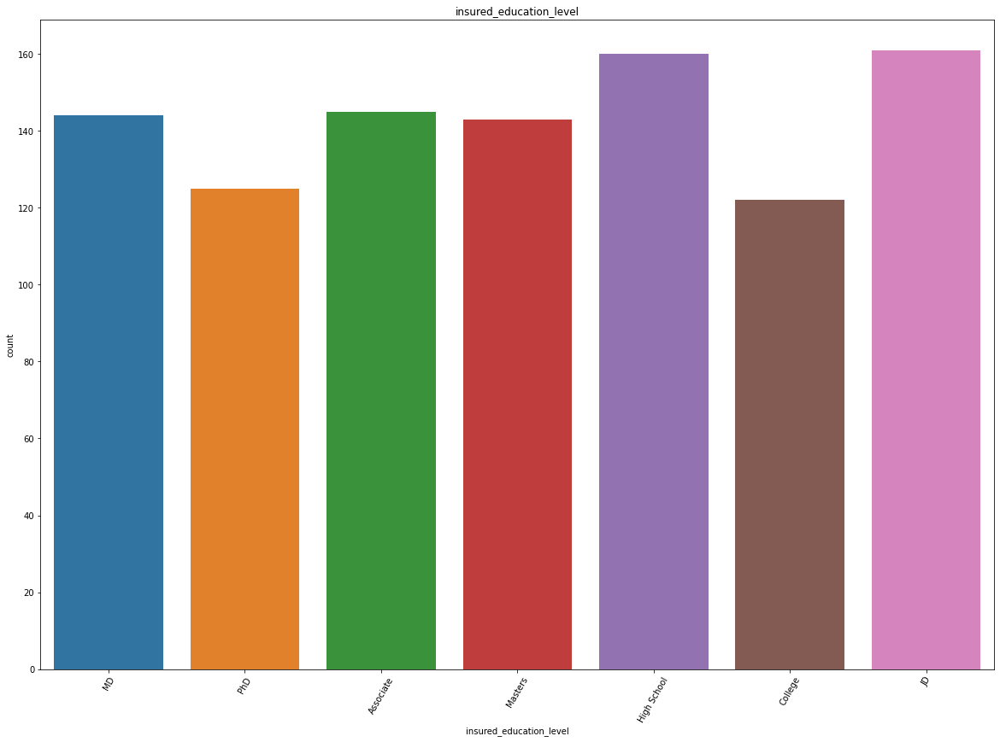

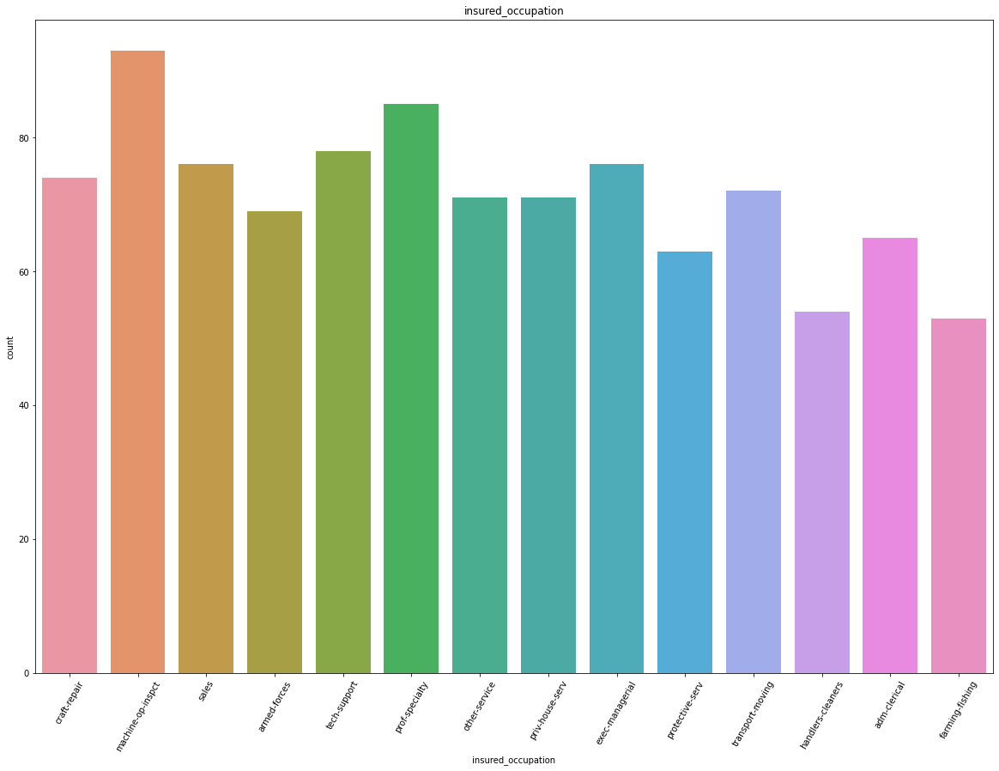

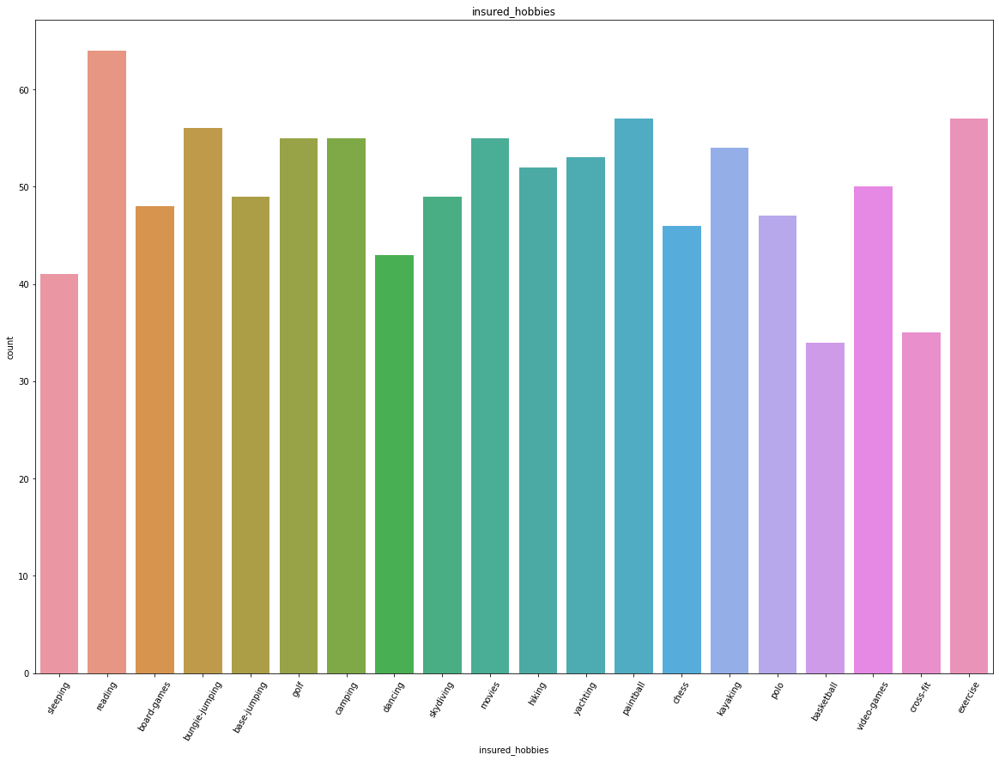

...

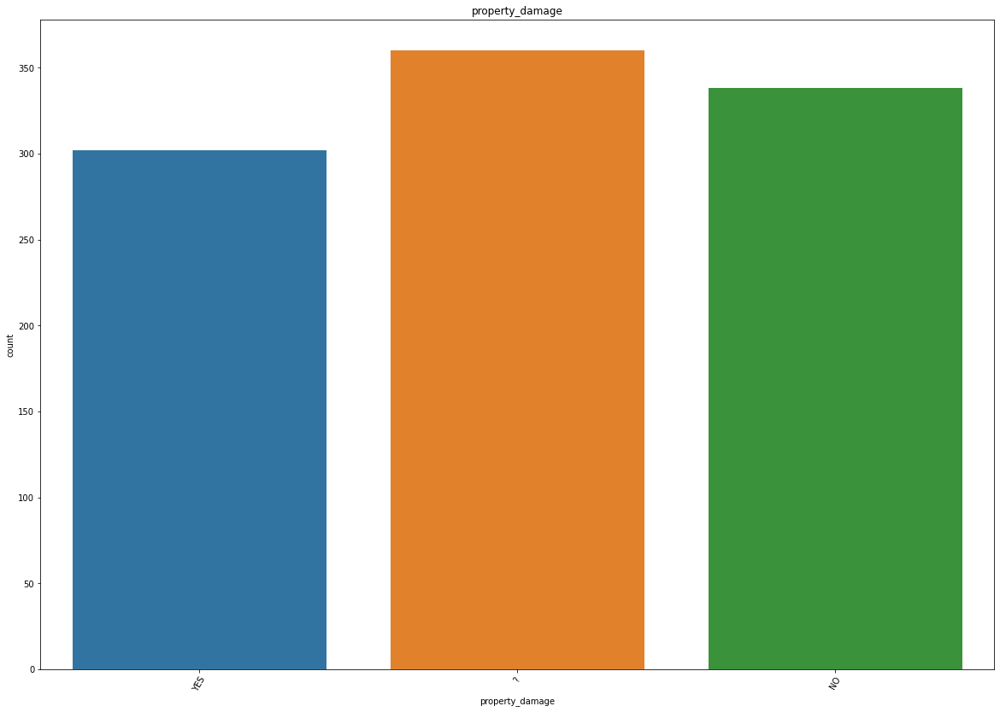

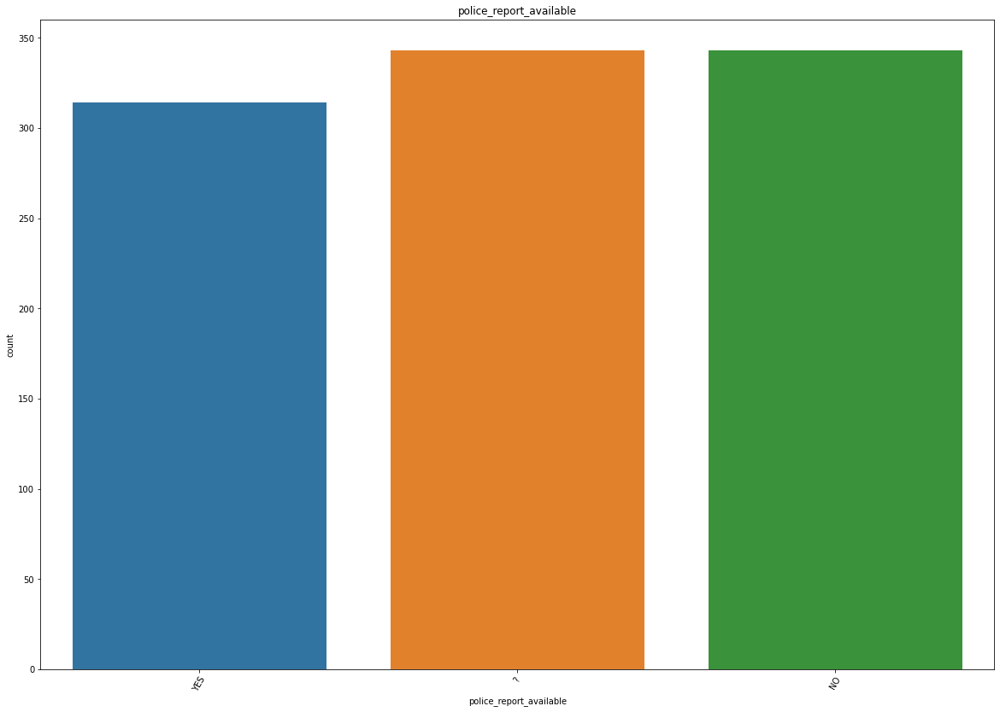

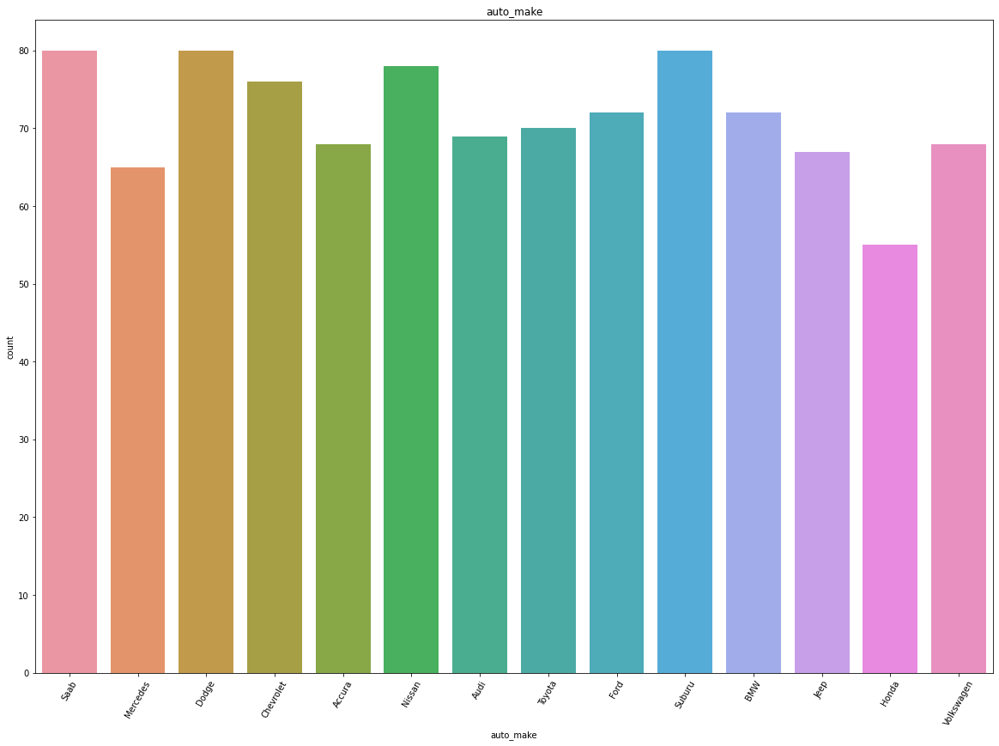

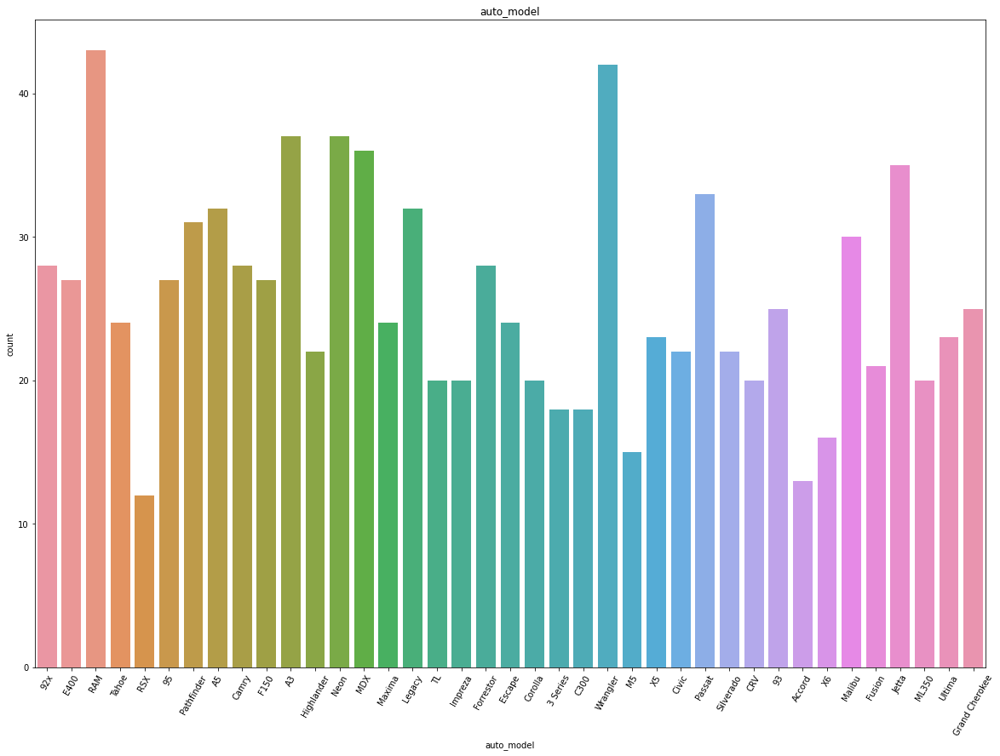

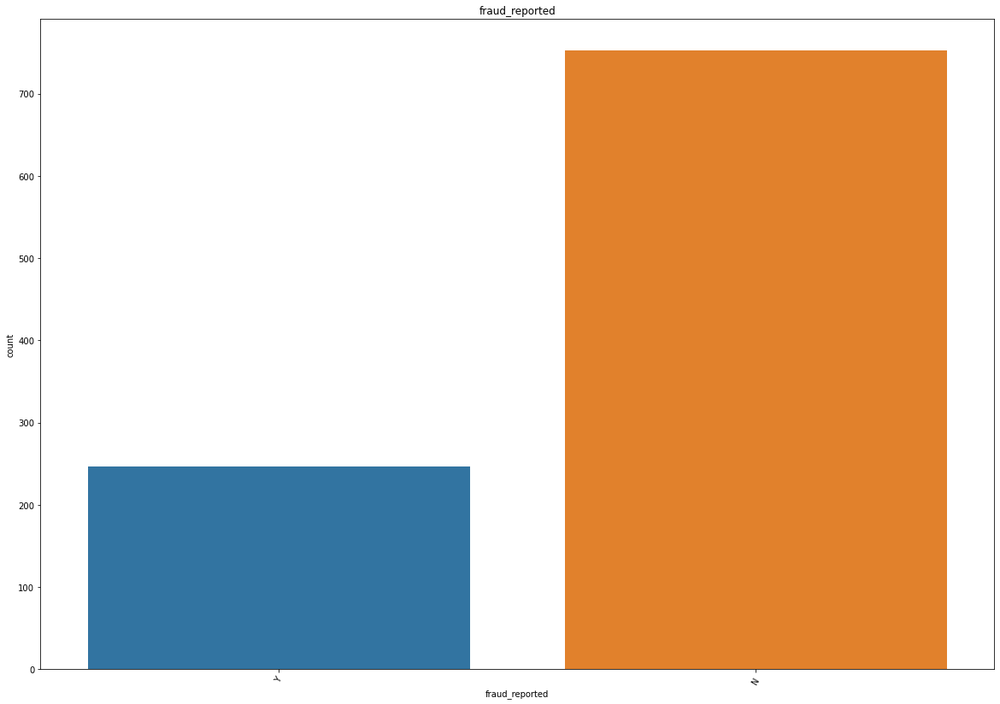

In [39]:
# countplot for object types features

for i in df[object_datatypes]:              
    plt.figure(figsize = (20, 14))
    sns.countplot(df[i])
    plt.title(i)
    plt.xticks(rotation=60)
    plt.show()

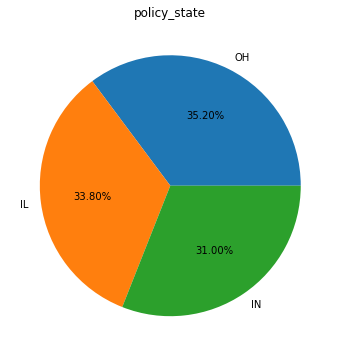

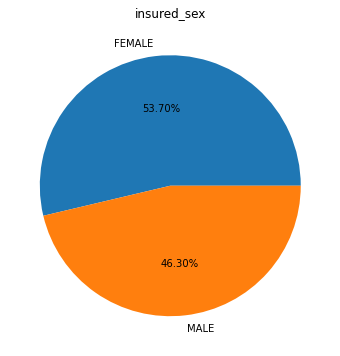

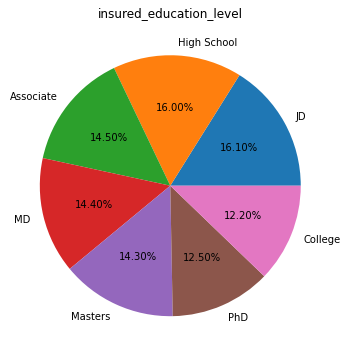

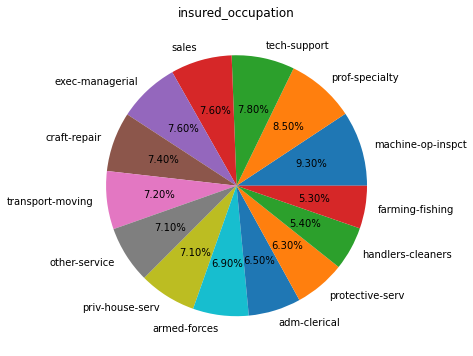

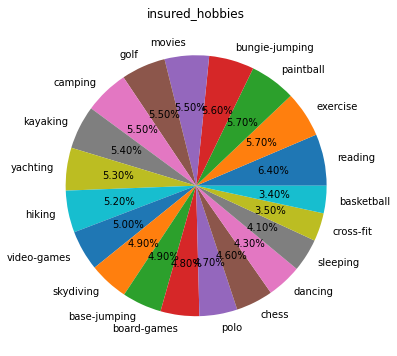

...

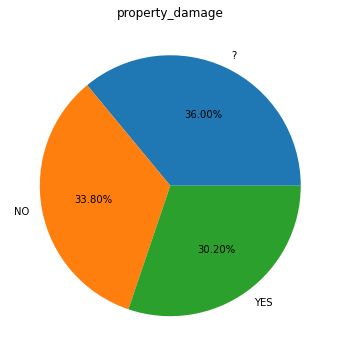

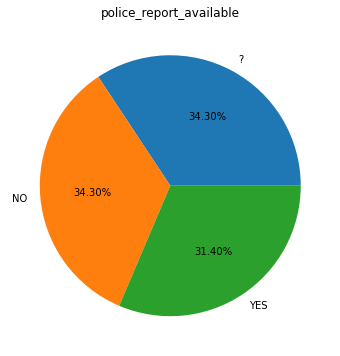

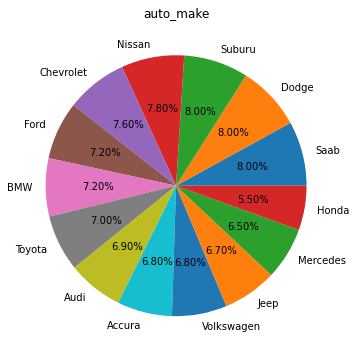

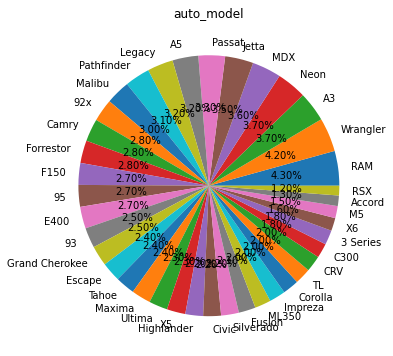

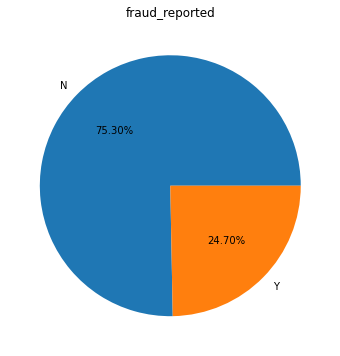

In [40]:
# piechart for object types features

for i in df[object_datatypes]:              
    plt.figure(figsize = (8,6))
    plt.pie(df[i].value_counts().values,labels=df[i].value_counts().index,autopct='%1.2f%%')
    plt.title(i)
    plt.xticks(rotation=60)
    plt.show()

In [41]:
# From above we can observe the following:- 

# OH count is more in policy_state.
# Female is more.
# High school and JD are more in number.
# Most of the insured are machine-op-inspect.
# reading is the hobby of most of the insured followed by paintball and excercise.
# most of the insured are own child.
# Most of the incident happened is multiple vehicle collission followed by single vehicle collission and least is parked car.
# Rear collission is the most in the dataset.
# Most of the incident severity is Minor Damage and only a smaller amount of trivial damage occured.
# Contacted authority is mostly Police and least with None contacted.
# NY is the most incident happened state in the dataset and least amount of incidents in OH.
# Springfield is the most incident happened city in the dataset and least amount of incidents in Northbrook.
# Most of the data doesnt have any property damage.
# In most cases, police report is not available.
# Saab, Mercedes and Subaru is the most incident happened vehicles. least incident happened with honda.
# RAM and C300 is the most accident marked vehicles. least is RSX.
# Fraud reported is NO in most cases. genuine cases are more.

In [42]:
# distplot for numerical type features

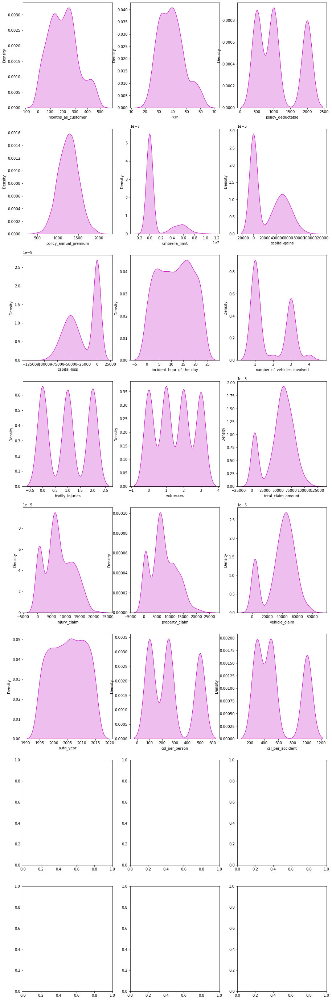

In [43]:
fig, ax = plt.subplots(ncols=3, nrows=8, figsize=(15,50))
index = 0
ax = ax.flatten()
for col, value in df[numerical_datatypes].items():
    sns.distplot(value, ax=ax[index], hist=False, color="m", kde_kws={"shade": True})
    index += 1
plt.show()

In [44]:
# Outliers and skewness is present, which needs to be treated.

In [45]:
# to check the outliers let's check the boxplots first...

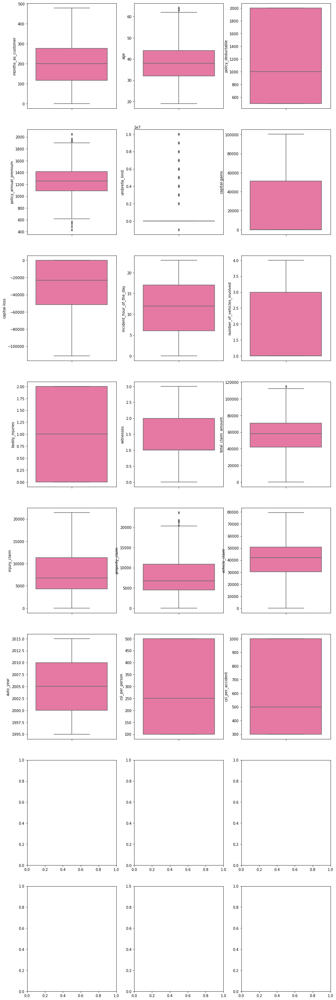

In [46]:
# Boxplot for the integer type features 

fig, ax = plt.subplots(ncols=3, nrows=8, figsize=(15,50))
index = 0
ax = ax.flatten()
for col, value in df[numerical_datatypes].items():
    sns.boxplot(y=col, data=df, ax=ax[index], palette="RdPu")
    index += 1
plt.show()

In [47]:
# some has outliers that are needed to be removed

In [48]:
# Encoding the object datatype columns

In [49]:
df

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,csl_per_person,csl_per_accident
0,328,48,OH,1000,1406.91,0,MALE,MD,craft-repair,sleeping,...,71610,6510,13020,52080,Saab,92x,2004,Y,250,500
1,228,42,IN,2000,1197.22,5000000,MALE,MD,machine-op-inspct,reading,...,5070,780,780,3510,Mercedes,E400,2007,Y,250,500
2,134,29,OH,2000,1413.14,5000000,FEMALE,PhD,sales,board-games,...,34650,7700,3850,23100,Dodge,RAM,2007,N,100,300
3,256,41,IL,2000,1415.74,6000000,FEMALE,PhD,armed-forces,board-games,...,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,250,500
4,228,44,IL,1000,1583.91,6000000,MALE,Associate,sales,board-games,...,6500,1300,650,4550,Accura,RSX,2009,N,500,1000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,1000,1310.80,0,FEMALE,Masters,craft-repair,paintball,...,87200,17440,8720,61040,Honda,Accord,2006,N,500,1000
996,285,41,IL,1000,1436.79,0,FEMALE,PhD,prof-specialty,sleeping,...,108480,18080,18080,72320,Volkswagen,Passat,2015,N,100,300
997,130,34,OH,500,1383.49,3000000,FEMALE,Masters,armed-forces,bungie-jumping,...,67500,7500,7500,52500,Suburu,Impreza,1996,N,250,500
998,458,62,IL,2000,1356.92,5000000,MALE,Associate,handlers-cleaners,base-jumping,...,46980,5220,5220,36540,Audi,A5,1998,N,500,1000


In [50]:
object_datatypes

['policy_state',
 'insured_sex',
 'insured_education_level',
 'insured_occupation',
 'insured_hobbies',
 'insured_relationship',
 'incident_date',
 'incident_type',
 'collision_type',
 'incident_severity',
 'authorities_contacted',
 'incident_state',
 'incident_city',
 'property_damage',
 'police_report_available',
 'auto_make',
 'auto_model',
 'fraud_reported']

In [51]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df[object_datatypes]= df[object_datatypes].apply(le.fit_transform)

In [52]:
df.dtypes

months_as_customer               int64
age                              int64
policy_state                     int32
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_sex                      int32
insured_education_level          int32
insured_occupation               int32
insured_hobbies                  int32
insured_relationship             int32
capital-gains                    int64
capital-loss                     int64
incident_date                    int32
incident_type                    int32
collision_type                   int32
incident_severity                int32
authorities_contacted            int32
incident_state                   int32
incident_city                    int32
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage                  int32
bodily_injuries                  int64
witnesses                        int64
police_report_available  

In [53]:
df

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,csl_per_person,csl_per_accident
0,328,48,2,1000,1406.91,0,1,4,2,17,...,71610,6510,13020,52080,10,1,2004,1,250,500
1,228,42,1,2000,1197.22,5000000,1,4,6,15,...,5070,780,780,3510,8,12,2007,1,250,500
2,134,29,2,2000,1413.14,5000000,0,6,11,2,...,34650,7700,3850,23100,4,30,2007,0,100,300
3,256,41,0,2000,1415.74,6000000,0,6,1,2,...,63400,6340,6340,50720,3,34,2014,1,250,500
4,228,44,0,1000,1583.91,6000000,1,0,11,2,...,6500,1300,650,4550,0,31,2009,0,500,1000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2,1000,1310.80,0,0,5,2,13,...,87200,17440,8720,61040,6,6,2006,0,500,1000
996,285,41,0,1000,1436.79,0,0,6,9,17,...,108480,18080,18080,72320,13,28,2015,0,100,300
997,130,34,2,500,1383.49,3000000,0,5,1,3,...,67500,7500,7500,52500,11,19,1996,0,250,500
998,458,62,0,2000,1356.92,5000000,1,0,5,0,...,46980,5220,5220,36540,1,5,1998,0,500,1000


In [54]:
# we have successfully changed all the object type data into int or float type ones!

In [55]:
# In our target column fraud_reported:-
# Y is represented as 1 and N is represented as 0

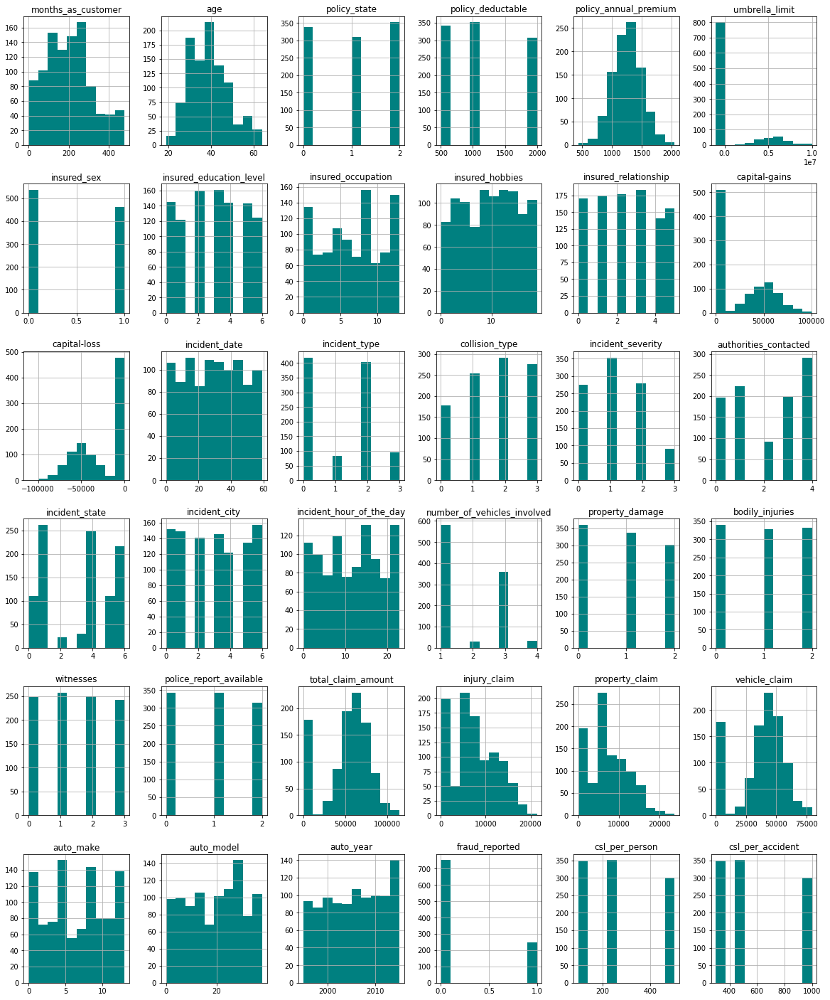

In [56]:
df.hist(figsize=(20,25), color= 'teal')
plt.show()

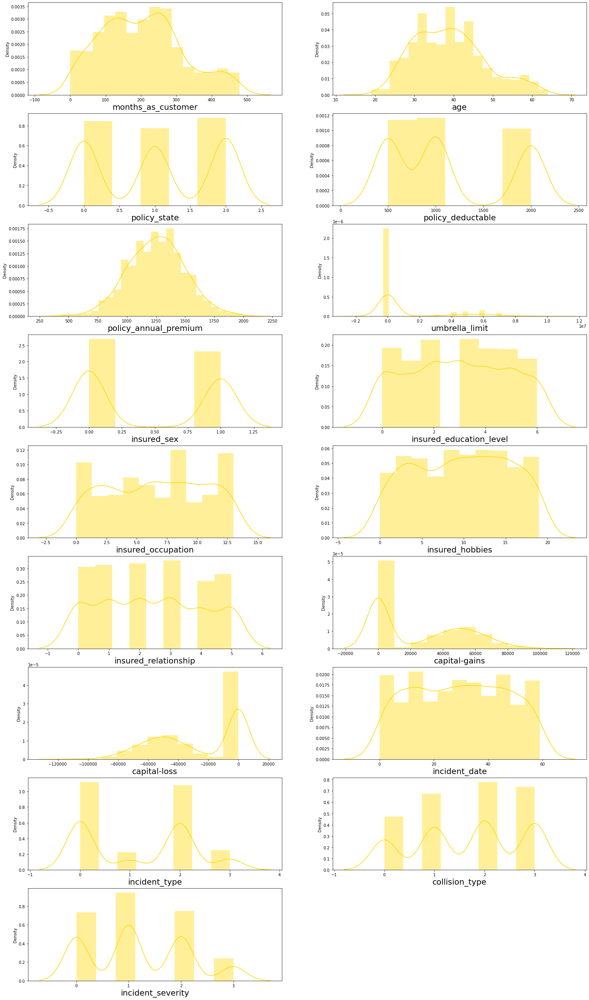

In [57]:
#Univariate Analysis

plt.figure(figsize = (25,50), facecolor = 'white')
plotnumber = 1

for column in df:
    if plotnumber <=17:
        ax = plt.subplot(10,2,plotnumber)
        sns.distplot(df[column], color = 'gold')
        plt.xlabel(column,fontsize=20)
        
    plotnumber +=1
plt.show()

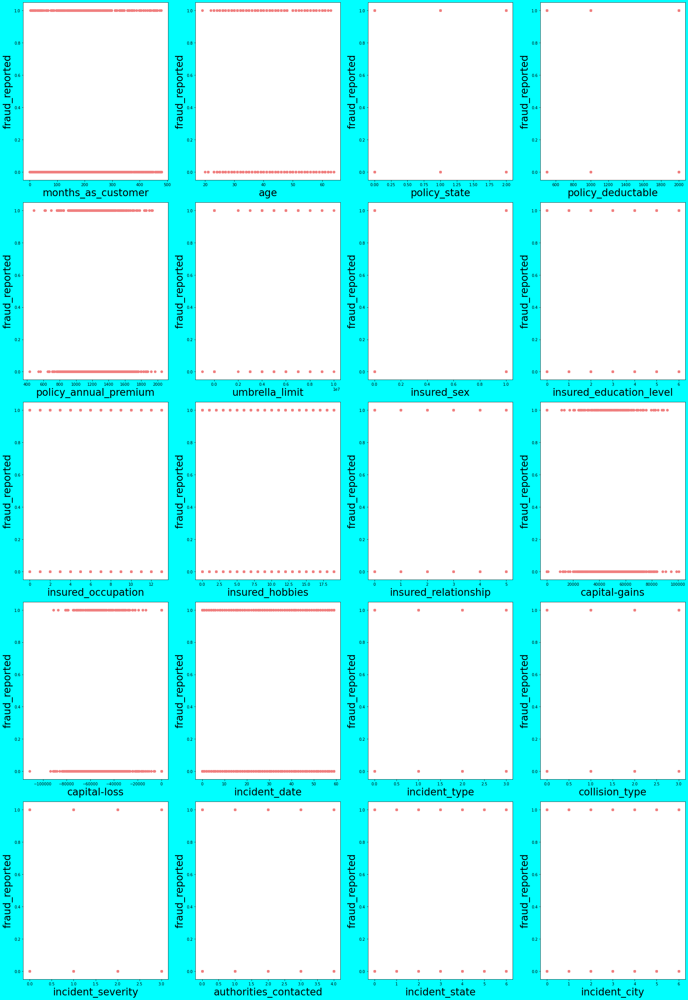

In [58]:
#Bivariate Analysis w.r.t. fraud_reported:-

plt.figure(figsize = (25,50), facecolor = 'cyan')
plotnumber = 1

for column in df:
    if plotnumber <=20:
        ax = plt.subplot(7,4,plotnumber)
        plt.scatter(df[column],df['fraud_reported'], color='lightcoral')
        plt.xlabel(column,fontsize=26)
        plt.ylabel('fraud_reported', fontsize=26)
    plotnumber += 1
plt.tight_layout()

In [59]:
# relationship not clear!

In [60]:
#Lets plot a stacked plot of object type cols with target

def stacked_plot(df, group, target):
    fig, ax = plt.subplots(figsize = (6,4))
    temp_df = (df.groupby([group, target]).size()/df.groupby(group)[target].count()).reset_index().pivot(columns=target, index=group, values=0)
    temp_df.plot(kind='bar', stacked=True, ax = ax, color = ["green", "pink"])
    ax.xaxis.set_tick_params(rotation=60)
    ax.set_xlabel(group)
    ax.set_ylabel('fraud_reported percentage')

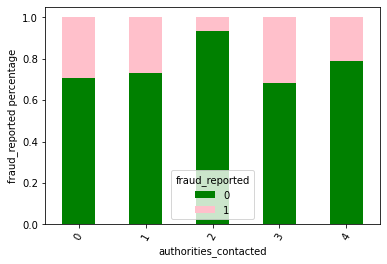

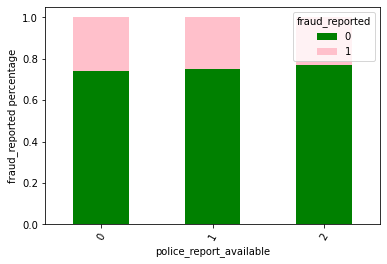

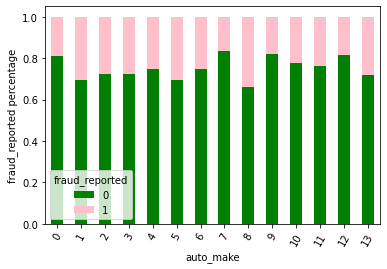

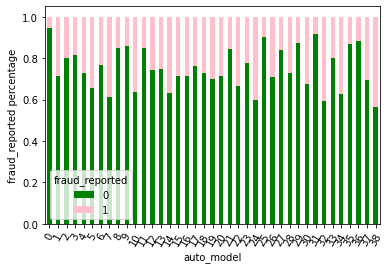

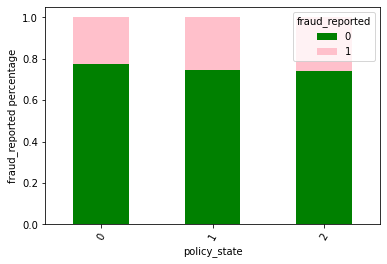

In [61]:
#miscellenious

stacked_plot(df, "authorities_contacted", "fraud_reported")
stacked_plot(df, "police_report_available", "fraud_reported")
stacked_plot(df, "auto_make", "fraud_reported")
stacked_plot(df, "auto_model", "fraud_reported")
stacked_plot(df, "policy_state", "fraud_reported")

In [62]:
# No specific pattern for target and authorities contacted.
# No specific pattern for target and police_report_available.
# Mercedes is reported fraud more.
# No specific pattern for target and policy_state.

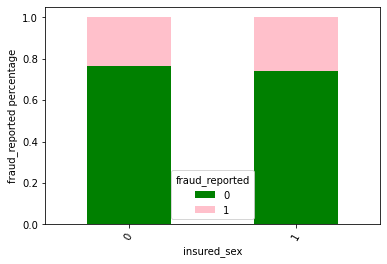

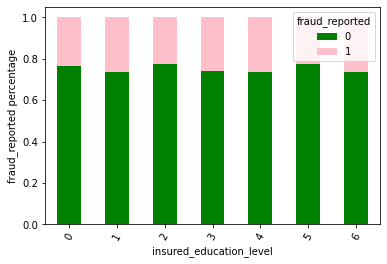

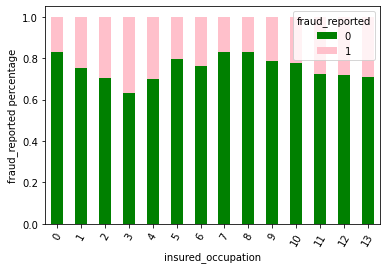

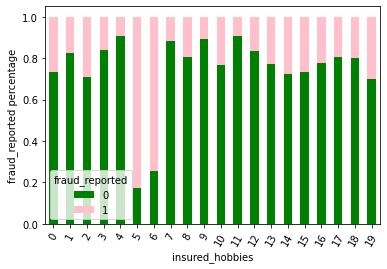

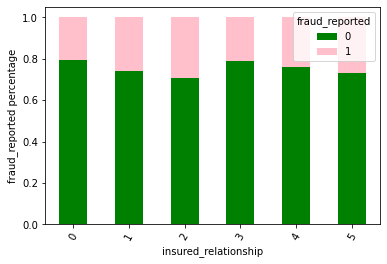

In [63]:
#lets check for insured personal information


stacked_plot(df, "insured_sex", "fraud_reported")
stacked_plot(df, "insured_education_level", "fraud_reported")
stacked_plot(df, "insured_occupation", "fraud_reported")
stacked_plot(df, "insured_hobbies", "fraud_reported")
stacked_plot(df, "insured_relationship", "fraud_reported")

In [64]:
# The insured_sex, insured_education and insured_relationship doesnt have a specific pattern with fraud reported.
# Insured with occupation as adm-clerical, other service and pvt-house-service have more of acceptance of claim than reported as fraud.
# Insured with occupation executive managerial are reported fraud more.
# Insured with hobbies chess and crossfit have been reported as fraud more than others.

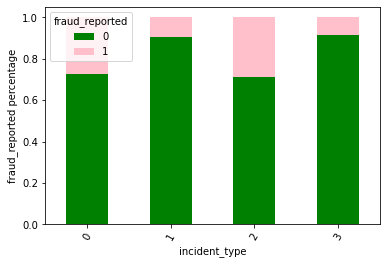

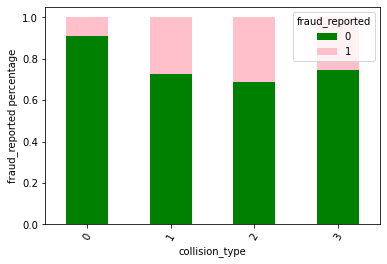

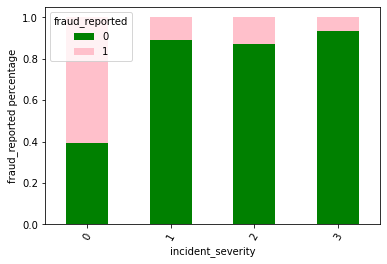

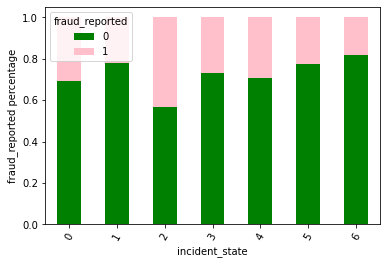

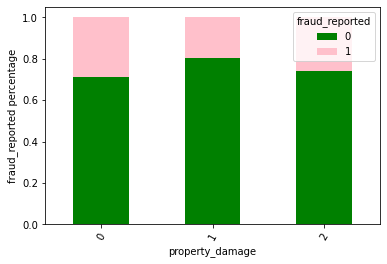

In [65]:
# Lets check relationship between incidents reported and fraud

stacked_plot(df, "incident_type", "fraud_reported")
stacked_plot(df, "collision_type", "fraud_reported")
stacked_plot(df, "incident_severity", "fraud_reported")
stacked_plot(df, "incident_state", "fraud_reported")
stacked_plot(df, "property_damage", "fraud_reported")

In [66]:
# fraud reported is more for single vehicle collission. this might be because there are more data with single vehicle collission.
# No specific relation between target and collission type.
# Major damage is reported as fraud than any other incident severity.
# More number of fraud is reported in OH.
# No specific relation between target and property damage.

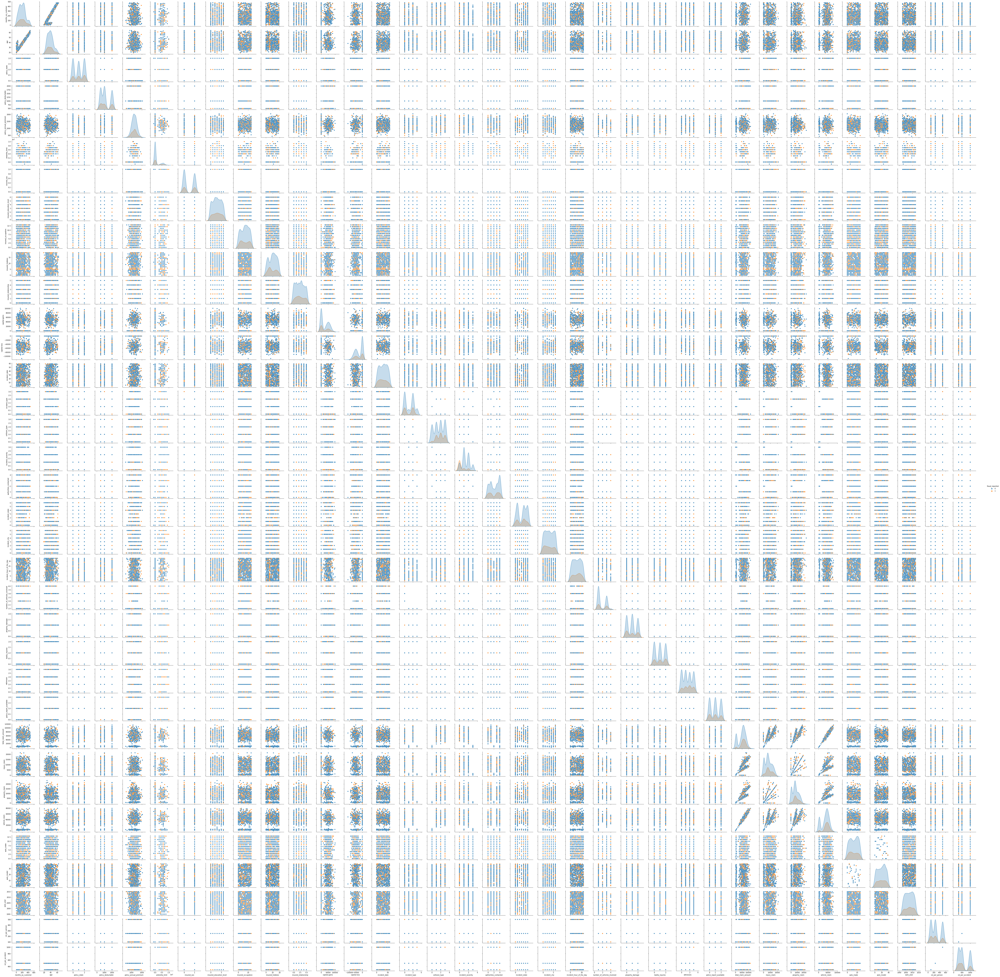

In [67]:
# Multivariate Analysis

sns.pairplot(df,hue="fraud_reported")

In [68]:
# We can see from above plot that, some variable are having positive relation with target and some negative. we can also see that a few of the variable does not have any relation with target. 
# Most of the Numerical columns have no relationship.

In [69]:
df.corr()

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,csl_per_person,csl_per_accident
months_as_customer,1.000000,0.922098,-0.000328,0.026807,0.005018,0.015498,0.060925,-0.000833,0.009814,-0.093661,...,0.062108,0.065329,0.034940,0.061013,0.047655,0.004202,-0.000292,0.020544,-0.025953,-0.025009
age,0.922098,1.000000,-0.014533,0.029188,0.014404,0.018126,0.073337,0.000969,0.017220,-0.081315,...,0.069863,0.075522,0.060898,0.062588,0.030410,0.017343,0.001354,0.012143,-0.015500,-0.015519
policy_state,-0.000328,-0.014533,1.000000,0.010033,0.012455,-0.029580,-0.020481,-0.034327,-0.031215,-0.038689,...,-0.006002,-0.046290,0.008406,0.001425,0.017124,-0.025253,0.002114,0.029432,-0.003855,-0.007221
policy_deductable,0.026807,0.029188,0.010033,1.000000,-0.003245,0.010870,-0.009733,0.015217,-0.046733,0.004061,...,0.022839,0.039107,0.064792,0.005269,-0.035379,-0.003268,0.026105,0.014817,0.003742,0.003943
policy_annual_premium,0.005018,0.014404,0.012455,-0.003245,1.000000,-0.006247,0.038853,-0.019715,0.035922,-0.018019,...,0.009094,-0.017633,-0.011654,0.020246,0.000045,-0.031849,-0.049226,-0.014480,0.021251,0.019066
umbrella_limit,0.015498,0.018126,-0.029580,0.010870,-0.006247,1.000000,0.010688,-0.019357,0.023422,-0.037000,...,-0.040344,-0.045412,-0.023790,-0.038584,-0.004443,0.040256,0.009893,0.058622,0.017154,0.013795
insured_sex,0.060925,0.073337,-0.020481,-0.009733,0.038853,0.010688,1.000000,0.009002,-0.006160,-0.020317,...,-0.023727,0.000924,-0.014868,-0.029609,0.026457,-0.018421,-0.028247,0.030873,-0.021566,-0.028850
insured_education_level,-0.000833,0.000969,-0.034327,0.015217,-0.019715,-0.019357,0.009002,1.000000,-0.020298,0.021807,...,0.074226,0.081880,0.055794,0.068348,0.055202,0.049445,0.043509,0.008808,0.009442,0.009521
insured_occupation,0.009814,0.017220,-0.031215,-0.046733,0.035922,0.023422,-0.006160,-0.020298,1.000000,-0.011077,...,0.003692,0.020211,0.003004,-0.000829,0.042621,0.020584,-0.006676,0.001564,0.015042,0.014324
insured_hobbies,-0.093661,-0.081315,-0.038689,0.004061,-0.018019,-0.037000,-0.020317,0.021807,-0.011077,1.000000,...,-0.004488,0.028393,0.012535,-0.016814,0.001525,0.030948,-0.014495,-0.046838,-0.011580,-0.015361


<AxesSubplot:>

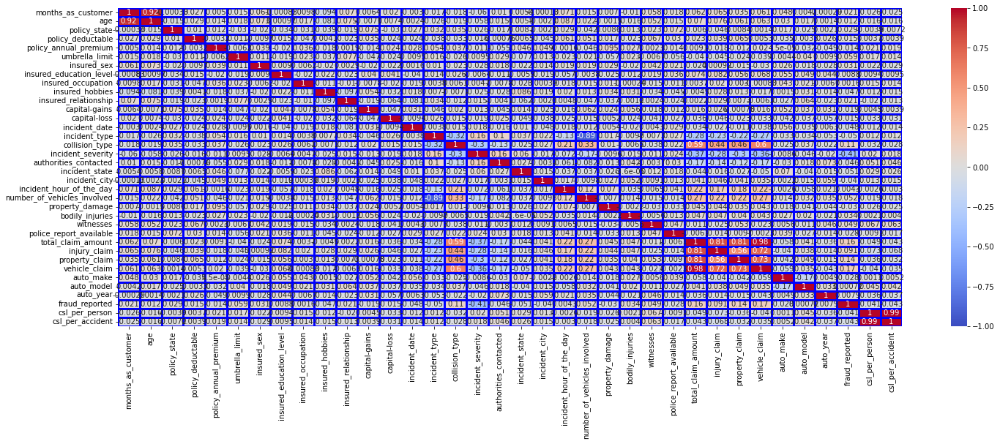

In [70]:
#let us make a heatmap

import matplotlib.pyplot as plt
plt.figure(figsize=(24,8))
sns.heatmap(df.corr(), annot = True, vmin=-1, vmax=1, center= 0, cmap= 'coolwarm', linewidths=3, linecolor='blue')

In [71]:
# let us now check for the skewness
df.skew()

months_as_customer             0.362177
age                            0.478988
policy_state                  -0.026177
policy_deductable              0.477887
policy_annual_premium          0.004402
umbrella_limit                 1.806712
insured_sex                    0.148630
insured_education_level       -0.000148
insured_occupation            -0.058881
insured_hobbies               -0.061563
insured_relationship           0.077488
capital-gains                  0.478850
capital-loss                  -0.391472
incident_date                  0.004756
incident_type                  0.101507
collision_type                -0.193345
incident_severity              0.279016
authorities_contacted         -0.121744
incident_state                -0.148865
incident_city                  0.049531
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.502664
property_damage                0.106418
bodily_injuries                0.014777
witnesses                      0.019636


In [72]:
# skewness is present!

In [73]:
# let us work for the outliers

In [74]:
# Using Z Score to remove outliers

from scipy.stats import zscore
import numpy as np
z=np.abs(zscore(df))
threshold= 3
np.where(z>3)

(array([ 31,  48,  88, 115, 119, 229, 248, 262, 314, 430, 458, 500, 503,
        657, 700, 763, 807, 875, 922, 975], dtype=int64),
 array([ 5,  5,  5,  5,  5,  4,  4,  5,  5,  5,  5, 28,  5,  5,  5,  4, 12,
         5,  5,  5], dtype=int64))

In [75]:
df= df[(z<3).all(axis=1)]
df

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,csl_per_person,csl_per_accident
0,328,48,2,1000,1406.91,0,1,4,2,17,...,71610,6510,13020,52080,10,1,2004,1,250,500
1,228,42,1,2000,1197.22,5000000,1,4,6,15,...,5070,780,780,3510,8,12,2007,1,250,500
2,134,29,2,2000,1413.14,5000000,0,6,11,2,...,34650,7700,3850,23100,4,30,2007,0,100,300
3,256,41,0,2000,1415.74,6000000,0,6,1,2,...,63400,6340,6340,50720,3,34,2014,1,250,500
4,228,44,0,1000,1583.91,6000000,1,0,11,2,...,6500,1300,650,4550,0,31,2009,0,500,1000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2,1000,1310.80,0,0,5,2,13,...,87200,17440,8720,61040,6,6,2006,0,500,1000
996,285,41,0,1000,1436.79,0,0,6,9,17,...,108480,18080,18080,72320,13,28,2015,0,100,300
997,130,34,2,500,1383.49,3000000,0,5,1,3,...,67500,7500,7500,52500,11,19,1996,0,250,500
998,458,62,0,2000,1356.92,5000000,1,0,5,0,...,46980,5220,5220,36540,1,5,1998,0,500,1000


In [76]:
# now again check the boxplot

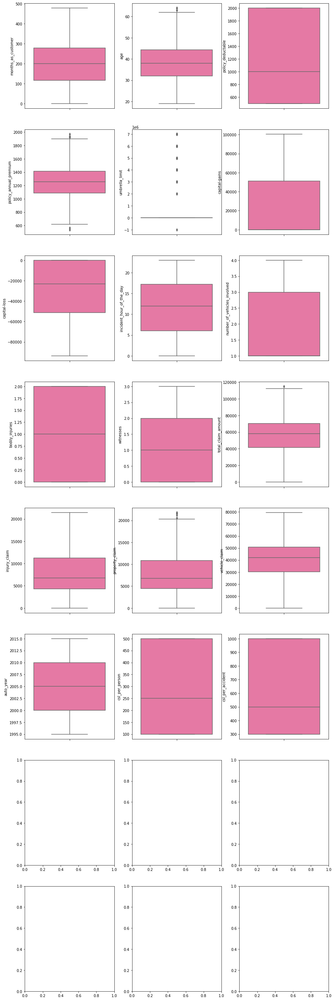

In [77]:
# Boxplot

fig, ax = plt.subplots(ncols=3, nrows=8, figsize=(15,50))
index = 0
ax = ax.flatten()
for col, value in df[numerical_datatypes].items():
    sns.boxplot(y=col, data=df, ax=ax[index], palette="RdPu")
    index += 1
plt.show()

In [78]:
df.shape

(980, 36)

In [79]:
loss_percentage=(((1000-980)/1000)*100)
loss_percentage

2.0

In [81]:
# Loss percentage is low. So we can proceed with this new dataset.

In [103]:
df.skew().sort_values()

vehicle_claim                 -0.620936
total_claim_amount            -0.593593
capital-loss                  -0.376884
collision_type                -0.194015
incident_state                -0.149255
authorities_contacted         -0.114044
auto_model                    -0.073462
insured_hobbies               -0.061488
insured_occupation            -0.055360
auto_year                     -0.054522
incident_hour_of_the_day      -0.039280
policy_state                  -0.038157
auto_make                     -0.028739
incident_date                  0.002604
bodily_injuries                0.003757
insured_education_level        0.006286
witnesses                      0.026211
policy_annual_premium          0.035964
incident_city                  0.043882
police_report_available        0.044659
insured_relationship           0.078339
incident_type                  0.090563
property_damage                0.101196
insured_sex                    0.139324
injury_claim                   0.271759


In [82]:
# We just check numerical columns except the target column that have skewness more than +0.5 and -0.5
# So it is clear that 'vehicle_claim', 'total_claim_amount', 'number_of_vehicles_involved', 'csl_per_accident', 'umbrella_limit' have skewness more than +0.5 and -0.5.

In [83]:
numerical_datatypes

['months_as_customer',
 'age',
 'policy_deductable',
 'policy_annual_premium',
 'umbrella_limit',
 'capital-gains',
 'capital-loss',
 'incident_hour_of_the_day',
 'number_of_vehicles_involved',
 'bodily_injuries',
 'witnesses',
 'total_claim_amount',
 'injury_claim',
 'property_claim',
 'vehicle_claim',
 'auto_year',
 'csl_per_person',
 'csl_per_accident']

In [84]:
# Using Power transformer to remove skewness

In [85]:
skew_cols= ['vehicle_claim', 'total_claim_amount', 'number_of_vehicles_involved', 'csl_per_accident', 'umbrella_limit']

In [86]:
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
df[skew_cols] = scaler.fit_transform(df[skew_cols].values)

In [87]:
df.skew().sort_values()

umbrella_limit                -7.932397
vehicle_claim                 -0.521805
total_claim_amount            -0.508540
capital-loss                  -0.376884
collision_type                -0.194015
incident_state                -0.149255
authorities_contacted         -0.114044
auto_model                    -0.073462
insured_hobbies               -0.061488
insured_occupation            -0.055360
auto_year                     -0.054522
incident_hour_of_the_day      -0.039280
policy_state                  -0.038157
auto_make                     -0.028739
incident_date                  0.002604
bodily_injuries                0.003757
insured_education_level        0.006286
witnesses                      0.026211
policy_annual_premium          0.035964
incident_city                  0.043882
police_report_available        0.044659
insured_relationship           0.078339
incident_type                  0.090563
property_damage                0.101196
csl_per_accident               0.112980


In [88]:
skew_cols= ['vehicle_claim', 'total_claim_amount', 'umbrella_limit']

In [89]:
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
df[skew_cols] = scaler.fit_transform(df[skew_cols].values)

In [90]:
df.skew().sort_values()

umbrella_limit                -1.801219
capital-loss                  -0.376884
collision_type                -0.194015
incident_state                -0.149255
authorities_contacted         -0.114044
auto_model                    -0.073462
insured_hobbies               -0.061488
insured_occupation            -0.055360
auto_year                     -0.054522
incident_hour_of_the_day      -0.039280
policy_state                  -0.038157
auto_make                     -0.028739
incident_date                  0.002604
bodily_injuries                0.003757
insured_education_level        0.006286
witnesses                      0.026211
policy_annual_premium          0.035964
incident_city                  0.043882
police_report_available        0.044659
vehicle_claim                  0.049303
total_claim_amount             0.052046
insured_relationship           0.078339
incident_type                  0.090563
property_damage                0.101196
csl_per_accident               0.112980


In [91]:
# skewness has been removed much than before!

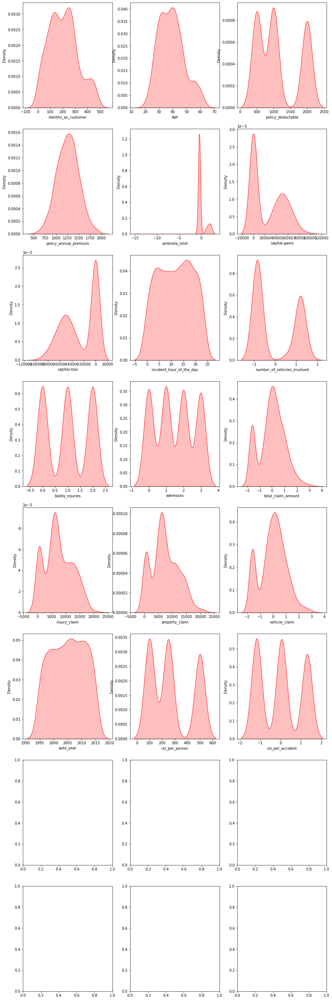

In [92]:
# visualize the skewness

fig, ax = plt.subplots(ncols=3, nrows=8, figsize=(15,50))
index = 0
ax = ax.flatten()
for col, value in df[numerical_datatypes].items():
    sns.distplot(value, ax=ax[index], hist=False, color="r", kde_kws={"shade": True})
    index += 1
plt.show()

In [93]:
# Following more normal distribution than before!

In [94]:
# Handle missing values

In [95]:
for i in df.columns:
    print( i ,'have unique values = ',df[i].unique(),'\n')

months_as_customer have unique values =  [328 228 134 256 137 165  27 212 235 447  60 121 180 473  70 140 160 196
 460 217 370 413 237   8 257 202 224 241  64 155 114 149 147  62 289 431
 199  79 116  37 106 269 265 163 355 192 430  91 223 195  22 439  94  11
 151 154 245 119 215 295 254 107 478 128 338 271 222 120 270 319 194 227
 244  78 200 284 275 153  41 127  61 207 219  80 325  29 239 279 350 464
 118 298  87 261 453 210 168 390 225 164 255 206 203 211 166 274  81 280
 112  24  93 171 124 287 122 398 214 209  82 193 288 104 101 375 461 428
  45 136 216 278 108  14 276  47  73 294 324  53 426 111  86 296 125 177
 238 449 252 359  19 285  30 342 468 343 404  63 335 142 272  69  38 281
 246 330 362 371 377 172  99 249 190 174  95   2 117 242 440  20 208 156
  84 394  35 369 332 243 264  32 259 186 201 436 189 105  88  40  59  39
 123 231 247  48 267 286 175 253  10 158   1  85 233 266  97 399 305 129
 283  96 176 159 290 299  66 334 429  15 230 250  65 475  77 229 110 292
 451 150 2

In [96]:
# there is no missing values there in the data set

In [97]:
df

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,csl_per_person,csl_per_accident
0,328,48,2,1000,1406.91,-0.402771,1,4,2,17,...,0.691928,6510,13020,0.740729,10,1,2004,1,250,0.058169
1,228,42,1,2000,1197.22,1.704981,1,4,6,15,...,-1.590308,780,780,-1.593092,8,12,2007,1,250,0.058169
2,134,29,2,2000,1413.14,1.704981,0,6,11,2,...,-0.795614,7700,3850,-0.883898,4,30,2007,0,100,-1.171386
3,256,41,0,2000,1415.74,2.100018,0,6,1,2,...,0.294309,6340,6340,0.642794,3,34,2014,1,250,0.058169
4,228,44,0,1000,1583.91,2.100018,1,0,11,2,...,-1.557878,1300,650,-1.561503,0,31,2009,0,500,1.315672
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2,1000,1310.80,-0.402771,0,5,2,13,...,1.540690,17440,8720,1.434046,6,6,2006,0,500,1.315672
996,285,41,0,1000,1436.79,-0.402771,0,6,9,17,...,2.872419,18080,18080,2.416070,13,28,2015,0,100,-1.171386
997,130,34,2,500,1383.49,0.907296,0,5,1,3,...,0.488308,7500,7500,0.771377,11,19,1996,0,250,0.058169
998,458,62,0,2000,1356.92,1.704981,1,0,5,0,...,-0.381544,5220,5220,-0.248190,1,5,1998,0,500,1.315672


# Prediction

In [98]:
# Train-Test split

X = df.drop('fraud_reported', axis=1)
y = df['fraud_reported']

In [99]:
X

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,csl_per_person,csl_per_accident
0,328,48,2,1000,1406.91,-0.402771,1,4,2,17,...,2,0.691928,6510,13020,0.740729,10,1,2004,250,0.058169
1,228,42,1,2000,1197.22,1.704981,1,4,6,15,...,0,-1.590308,780,780,-1.593092,8,12,2007,250,0.058169
2,134,29,2,2000,1413.14,1.704981,0,6,11,2,...,1,-0.795614,7700,3850,-0.883898,4,30,2007,100,-1.171386
3,256,41,0,2000,1415.74,2.100018,0,6,1,2,...,1,0.294309,6340,6340,0.642794,3,34,2014,250,0.058169
4,228,44,0,1000,1583.91,2.100018,1,0,11,2,...,1,-1.557878,1300,650,-1.561503,0,31,2009,500,1.315672
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2,1000,1310.80,-0.402771,0,5,2,13,...,0,1.540690,17440,8720,1.434046,6,6,2006,500,1.315672
996,285,41,0,1000,1436.79,-0.402771,0,6,9,17,...,0,2.872419,18080,18080,2.416070,13,28,2015,100,-1.171386
997,130,34,2,500,1383.49,0.907296,0,5,1,3,...,2,0.488308,7500,7500,0.771377,11,19,1996,250,0.058169
998,458,62,0,2000,1356.92,1.704981,1,0,5,0,...,2,-0.381544,5220,5220,-0.248190,1,5,1998,500,1.315672


In [100]:
y

0      1
1      1
2      0
3      1
4      0
      ..
995    0
996    0
997    0
998    0
999    0
Name: fraud_reported, Length: 980, dtype: int32

In [101]:
# check class imbalance

In [102]:
y.value_counts()

0    740
1    240
Name: fraud_reported, dtype: int64

In [103]:
# This indicates class imbalance that needed to be fixed by using the oversampling method

In [104]:
# Synthetic Minority Over-sampling Technique (SMOTE)

In [105]:
from imblearn.over_sampling import SMOTE
oversample = SMOTE()
X, y = oversample.fit_resample(X, y)

In [106]:
y.value_counts()

1    740
0    740
Name: fraud_reported, dtype: int64

In [107]:
# class imbalance problem is solved!

In [108]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)
X

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,csl_per_person,csl_per_accident
0,1.116284,1.050473,1.373177,-0.233346,0.680826,-0.471998,1.259926,0.616741,-1.192153,1.406278,...,1.501037,0.644988,-0.243809,1.130075,0.687134,0.965685,-1.717254,-0.165583,-0.103065,0.099604
1,0.214089,0.371169,0.127894,1.484532,-0.245359,1.786737,1.259926,0.616741,-0.140044,1.035083,...,-1.091185,-1.796516,-1.481114,-1.518338,-1.805336,0.433092,-0.671511,0.358056,-0.103065,0.099604
2,-0.633975,-1.100655,1.373177,1.484532,0.708344,1.786737,-0.793698,1.697588,1.175092,-1.377686,...,0.204926,-0.946364,0.013153,-0.854071,-1.047932,-0.632095,1.039705,0.358056,-1.102870,-1.221677
3,0.466703,0.257952,-1.117389,1.484532,0.719828,2.210071,-0.793698,1.697588,-1.455180,-1.377686,...,0.204926,0.219620,-0.280518,-0.315301,0.582541,-0.898391,1.419975,1.579880,-0.103065,0.099604
4,0.214089,0.597604,-1.117389,-0.233346,1.462622,2.210071,1.259926,-1.544955,1.175092,-1.377686,...,0.204926,-1.761823,-1.368828,-1.546467,-1.771599,-1.697282,1.134772,0.707148,1.563276,1.450918
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1475,0.033649,0.597604,-1.117389,1.484532,0.212758,-0.471998,-0.793698,1.157165,-0.140044,-0.820893,...,-1.091185,0.332103,0.618849,0.585896,0.147279,0.433092,-0.956713,-0.689222,1.563276,1.450918
1476,0.692252,0.484386,0.127894,-1.092285,0.126754,0.839743,-0.793698,-0.464107,0.122983,0.663888,...,-1.091185,0.194796,0.384992,0.167862,0.149212,0.433092,-0.481376,1.056241,-0.596303,-0.546605
1477,-1.743676,-0.647786,0.127894,-1.092285,0.310972,-0.168192,-0.793698,-1.544955,-0.929126,-1.563284,...,-1.091185,0.349347,-0.364517,0.888386,0.387620,-1.164688,1.229840,-1.736500,1.563276,1.450918
1478,-0.570821,0.371169,0.127894,0.426319,0.020658,-0.471998,-0.793698,0.616741,0.649037,0.478290,...,-1.091185,0.094189,0.720339,0.120260,-0.049147,-0.099501,-0.291241,-0.689222,1.563276,1.450918


In [109]:
# modelling and train and test split

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, log_loss
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import cross_val_score

lr= LogisticRegression()
dt= DecisionTreeClassifier()
rf= RandomForestClassifier()
svc= SVC()
knc= KNeighborsClassifier()
gb= GradientBoostingClassifier()

In [111]:
# LogisticRegression

In [112]:
#best random state for logistic regression.
maxAccu= 0
maxRS= 0

for i in range(1,200):
    X_train, X_test, y_train, y_test= train_test_split(X,y, test_size= .20, random_state= i)
    lr= LogisticRegression()
    lr.fit(X_train, y_train)
    prediction= lr.predict(X_test)
    acc= accuracy_score(y_test, prediction)
    print('accuracy', acc, 'random_state', i)
    
    if acc> maxAccu:
        maxAccu=acc
        maxRS= i
        print('max_accuracy', maxAccu, 'max_random_state', i)

accuracy 0.8108108108108109 random_state 1
max_accuracy 0.8108108108108109 max_random_state 1
accuracy 0.8547297297297297 random_state 2
max_accuracy 0.8547297297297297 max_random_state 2
accuracy 0.7635135135135135 random_state 3
accuracy 0.8108108108108109 random_state 4
accuracy 0.831081081081081 random_state 5
accuracy 0.777027027027027 random_state 6
accuracy 0.793918918918919 random_state 7
accuracy 0.7804054054054054 random_state 8
accuracy 0.8006756756756757 random_state 9
accuracy 0.8141891891891891 random_state 10
accuracy 0.831081081081081 random_state 11
accuracy 0.7972972972972973 random_state 12
accuracy 0.7668918918918919 random_state 13
accuracy 0.8378378378378378 random_state 14
accuracy 0.7635135135135135 random_state 15
accuracy 0.8277027027027027 random_state 16
accuracy 0.7837837837837838 random_state 17
accuracy 0.7837837837837838 random_state 18
accuracy 0.8141891891891891 random_state 19
accuracy 0.8006756756756757 random_state 20
accuracy 0.7635135135135135 ran

In [113]:
print('best accuracy is', maxAccu, 'on random_state', maxRS)

best accuracy is 0.8783783783783784 on random_state 86


In [114]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = maxRS)

# Training the model
lr.fit(X_train, y_train)
    
# Predicting Y_test
pred = lr.predict(X_test)
    
# Accuracy Score
acc_score = (accuracy_score(y_test, pred))*100
print("Accuracy Score:", acc_score)
    
# Classification Report
class_report = classification_report(y_test, pred)
print("\nClassification Report:\n", class_report)
    
# Cross Validation Score
cv_score = (cross_val_score(lr, X, y, cv=5).mean())*100
print("Cross Validation Score:", cv_score)
    
# Result of accuracy minus cv scores
result = acc_score - cv_score
print("\nAccuracy Score - Cross Validation Score is", result)

Accuracy Score: 87.83783783783784

Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.84      0.88       158
           1       0.84      0.92      0.88       138

    accuracy                           0.88       296
   macro avg       0.88      0.88      0.88       296
weighted avg       0.88      0.88      0.88       296

Cross Validation Score: 79.93243243243245

Accuracy Score - Cross Validation Score is 7.905405405405389


In [115]:
# DecisionTreeClassifier

In [116]:
#best random state 
maxAccu= 0
maxRS= 0

for i in range(1,200):
    X_train, X_test, y_train, y_test= train_test_split(X,y, test_size= .20, random_state= i)
    dt= DecisionTreeClassifier()
    dt.fit(X_train, y_train)
    prediction= dt.predict(X_test)
    acc= accuracy_score(y_test, prediction)
    print('accuracy', acc, 'random_state', i)
    
    if acc> maxAccu:
        maxAccu=acc
        maxRS= i
        print('max_accuracy', maxAccu, 'max_random_state', i)

accuracy 0.8108108108108109 random_state 1
max_accuracy 0.8108108108108109 max_random_state 1
accuracy 0.8614864864864865 random_state 2
max_accuracy 0.8614864864864865 max_random_state 2
accuracy 0.793918918918919 random_state 3
accuracy 0.8445945945945946 random_state 4
accuracy 0.8141891891891891 random_state 5
accuracy 0.7905405405405406 random_state 6
accuracy 0.793918918918919 random_state 7
accuracy 0.8040540540540541 random_state 8
accuracy 0.8614864864864865 random_state 9
accuracy 0.7837837837837838 random_state 10
accuracy 0.7905405405405406 random_state 11
accuracy 0.8074324324324325 random_state 12
accuracy 0.8006756756756757 random_state 13
accuracy 0.8412162162162162 random_state 14
accuracy 0.7905405405405406 random_state 15
accuracy 0.8378378378378378 random_state 16
accuracy 0.8006756756756757 random_state 17
accuracy 0.8209459459459459 random_state 18
accuracy 0.8682432432432432 random_state 19
max_accuracy 0.8682432432432432 max_random_state 19
accuracy 0.8108108108

In [117]:
print('best accuracy is', maxAccu, 'on random_state', maxRS)

best accuracy is 0.8682432432432432 on random_state 19


In [118]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = maxRS)

# Training the model
dt.fit(X_train, y_train)
    
# Predicting Y_test
pred = dt.predict(X_test)
    
# Accuracy Score
acc_score = (accuracy_score(y_test, pred))*100
print("Accuracy Score:", acc_score)
    
# Classification Report
class_report = classification_report(y_test, pred)
print("\nClassification Report:\n", class_report)
    
# Cross Validation Score
cv_score = (cross_val_score(dt, X, y, cv=5).mean())*100
print("Cross Validation Score:", cv_score)
    
# Result of accuracy minus cv scores
result = acc_score - cv_score
print("\nAccuracy Score - Cross Validation Score is", abs(result))

Accuracy Score: 85.8108108108108

Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.82      0.85       145
           1       0.84      0.89      0.87       151

    accuracy                           0.86       296
   macro avg       0.86      0.86      0.86       296
weighted avg       0.86      0.86      0.86       296

Cross Validation Score: 80.60810810810813

Accuracy Score - Cross Validation Score is 5.20270270270268


In [119]:
# RandomForestClassifier

In [120]:
#best random state 
maxAccu= 0
maxRS= 0

for i in range(1,200):
    X_train, X_test, y_train, y_test= train_test_split(X,y, test_size= .20, random_state= i)
    rf= RandomForestClassifier()
    rf.fit(X_train, y_train)
    prediction= rf.predict(X_test)
    acc= accuracy_score(y_test, prediction)
    print('accuracy', acc, 'random_state', i)
    
    if acc> maxAccu:
        maxAccu=acc
        maxRS= i
        print('max_accuracy', maxAccu, 'max_random_state', i)

accuracy 0.8817567567567568 random_state 1
max_accuracy 0.8817567567567568 max_random_state 1
accuracy 0.9054054054054054 random_state 2
max_accuracy 0.9054054054054054 max_random_state 2
accuracy 0.8648648648648649 random_state 3
accuracy 0.902027027027027 random_state 4
accuracy 0.8682432432432432 random_state 5
accuracy 0.8851351351351351 random_state 6
accuracy 0.875 random_state 7
accuracy 0.8547297297297297 random_state 8
accuracy 0.9087837837837838 random_state 9
max_accuracy 0.9087837837837838 max_random_state 9
accuracy 0.8547297297297297 random_state 10
accuracy 0.8547297297297297 random_state 11
accuracy 0.8378378378378378 random_state 12
accuracy 0.875 random_state 13
accuracy 0.8783783783783784 random_state 14
accuracy 0.8445945945945946 random_state 15
accuracy 0.902027027027027 random_state 16
accuracy 0.8851351351351351 random_state 17
accuracy 0.875 random_state 18
accuracy 0.9054054054054054 random_state 19
accuracy 0.875 random_state 20
accuracy 0.8513513513513513 ra

In [121]:
print('best accuracy is', maxAccu, 'on random_state', maxRS)

best accuracy is 0.9222972972972973 on random_state 86


In [124]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = maxRS)

# Training the model
rf.fit(X_train, y_train)
    
# Predicting Y_test
pred = rf.predict(X_test)
    
# Accuracy Score
acc_score = (accuracy_score(y_test, pred))*100
print("Accuracy Score:", acc_score)
    
# Classification Report
class_report = classification_report(y_test, pred)
print("\nClassification Report:\n", class_report)
    
# Cross Validation Score
cv_score = (cross_val_score(rf, X, y, cv=5).mean())*100
print("Cross Validation Score:", cv_score)
    
# Result of accuracy minus cv scores
result = acc_score - cv_score
print("\nAccuracy Score - Cross Validation Score is", abs(result))

Accuracy Score: 91.8918918918919

Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.92      0.92       158
           1       0.91      0.92      0.91       138

    accuracy                           0.92       296
   macro avg       0.92      0.92      0.92       296
weighted avg       0.92      0.92      0.92       296

Cross Validation Score: 86.0810810810811

Accuracy Score - Cross Validation Score is 5.810810810810807


In [125]:
# SVC

In [126]:
#best random state 
maxAccu= 0
maxRS= 0

for i in range(1,200):
    X_train, X_test, y_train, y_test= train_test_split(X,y, test_size= .20, random_state= i)
    svc= RandomForestClassifier()
    svc.fit(X_train, y_train)
    prediction= svc.predict(X_test)
    acc= accuracy_score(y_test, prediction)
    print('accuracy', acc, 'random_state', i)
    
    if acc> maxAccu:
        maxAccu=acc
        maxRS= i
        print('max_accuracy', maxAccu, 'max_random_state', i)

accuracy 0.8682432432432432 random_state 1
max_accuracy 0.8682432432432432 max_random_state 1
accuracy 0.9290540540540541 random_state 2
max_accuracy 0.9290540540540541 max_random_state 2
accuracy 0.8783783783783784 random_state 3
accuracy 0.8952702702702703 random_state 4
accuracy 0.8682432432432432 random_state 5
accuracy 0.8614864864864865 random_state 6
accuracy 0.8716216216216216 random_state 7
accuracy 0.8547297297297297 random_state 8
accuracy 0.8918918918918919 random_state 9
accuracy 0.8513513513513513 random_state 10
accuracy 0.8716216216216216 random_state 11
accuracy 0.8412162162162162 random_state 12
accuracy 0.8952702702702703 random_state 13
accuracy 0.8682432432432432 random_state 14
accuracy 0.8344594594594594 random_state 15
accuracy 0.8885135135135135 random_state 16
accuracy 0.8581081081081081 random_state 17
accuracy 0.8851351351351351 random_state 18
accuracy 0.8817567567567568 random_state 19
accuracy 0.8716216216216216 random_state 20
accuracy 0.8445945945945946

In [127]:
print('best accuracy is', maxAccu, 'on random_state', maxRS)

best accuracy is 0.9290540540540541 on random_state 2


In [129]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = maxRS)

# Training the model
svc.fit(X_train, y_train)
    
# Predicting Y_test
pred = svc.predict(X_test)
    
# Accuracy Score
acc_score = (accuracy_score(y_test, pred))*100
print("Accuracy Score:", acc_score)
    
# Classification Report
class_report = classification_report(y_test, pred)
print("\nClassification Report:\n", class_report)
    
# Cross Validation Score
cv_score = (cross_val_score(svc, X, y, cv=5).mean())*100
print("Cross Validation Score:", cv_score)
    
# Result of accuracy minus cv scores
result = acc_score - cv_score
print("\nAccuracy Score - Cross Validation Score is", result)

Accuracy Score: 91.8918918918919

Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.89      0.92       147
           1       0.90      0.95      0.92       149

    accuracy                           0.92       296
   macro avg       0.92      0.92      0.92       296
weighted avg       0.92      0.92      0.92       296

Cross Validation Score: 86.62162162162161

Accuracy Score - Cross Validation Score is 5.270270270270288


In [130]:
# KNeighborsClassifier

In [131]:
#best random state 
maxAccu= 0
maxRS= 0

for i in range(1,200):
    X_train, X_test, y_train, y_test= train_test_split(X,y, test_size= .20, random_state= i)
    knc= KNeighborsClassifier()
    knc.fit(X_train, y_train)
    prediction= knc.predict(X_test)
    acc= accuracy_score(y_test, prediction)
    print('accuracy', acc, 'random_state', i)
    
    if acc> maxAccu:
        maxAccu=acc
        maxRS= i
        print('max_accuracy', maxAccu, 'max_random_state', i)

accuracy 0.706081081081081 random_state 1
max_accuracy 0.706081081081081 max_random_state 1
accuracy 0.6925675675675675 random_state 2
accuracy 0.6722972972972973 random_state 3
accuracy 0.7331081081081081 random_state 4
max_accuracy 0.7331081081081081 max_random_state 4
accuracy 0.7027027027027027 random_state 5
accuracy 0.7162162162162162 random_state 6
accuracy 0.6587837837837838 random_state 7
accuracy 0.7094594594594594 random_state 8
accuracy 0.6722972972972973 random_state 9
accuracy 0.6993243243243243 random_state 10
accuracy 0.6790540540540541 random_state 11
accuracy 0.6858108108108109 random_state 12
accuracy 0.6452702702702703 random_state 13
accuracy 0.7297297297297297 random_state 14
accuracy 0.6993243243243243 random_state 15
accuracy 0.7195945945945946 random_state 16
accuracy 0.6722972972972973 random_state 17
accuracy 0.6554054054054054 random_state 18
accuracy 0.6858108108108109 random_state 19
accuracy 0.6891891891891891 random_state 20
accuracy 0.6993243243243243 r

In [132]:
print('best accuracy is', maxAccu, 'on random_state', maxRS)

best accuracy is 0.7533783783783784 on random_state 89


In [134]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = maxRS)

# Training the model
knc.fit(X_train, y_train)
    
# Predicting Y_test
pred = knc.predict(X_test)
    
# Accuracy Score
acc_score = (accuracy_score(y_test, pred))*100
print("Accuracy Score:", acc_score)
    
# Classification Report
class_report = classification_report(y_test, pred)
print("\nClassification Report:\n", class_report)
    
# Cross Validation Score
cv_score = (cross_val_score(svc, X, y, cv=5).mean())*100
print("Cross Validation Score:", cv_score)
    
# Result of accuracy minus cv scores
result = acc_score - cv_score
print("\nAccuracy Score - Cross Validation Score is", abs(result))

Accuracy Score: 75.33783783783784

Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.51      0.67       146
           1       0.68      0.99      0.80       150

    accuracy                           0.75       296
   macro avg       0.82      0.75      0.74       296
weighted avg       0.82      0.75      0.74       296

Cross Validation Score: 86.21621621621621

Accuracy Score - Cross Validation Score is 10.878378378378372


In [139]:
# Ensemble Techniques

In [135]:
# GradientBoostingClassifier

In [136]:
#best random state 
maxAccu= 0
maxRS= 0

for i in range(1,200):
    X_train, X_test, y_train, y_test= train_test_split(X,y, test_size= .20, random_state= i)
    gb= GradientBoostingClassifier()
    gb.fit(X_train, y_train)
    prediction= gb.predict(X_test)
    acc= accuracy_score(y_test, prediction)
    print('accuracy', acc, 'random_state', i)
    
    if acc> maxAccu:
        maxAccu=acc
        maxRS= i
        print('max_accuracy', maxAccu, 'max_random_state', i)

accuracy 0.8581081081081081 random_state 1
max_accuracy 0.8581081081081081 max_random_state 1
accuracy 0.9087837837837838 random_state 2
max_accuracy 0.9087837837837838 max_random_state 2
accuracy 0.8513513513513513 random_state 3
accuracy 0.8851351351351351 random_state 4
accuracy 0.8716216216216216 random_state 5
accuracy 0.8648648648648649 random_state 6
accuracy 0.8648648648648649 random_state 7
accuracy 0.8614864864864865 random_state 8
accuracy 0.9054054054054054 random_state 9
accuracy 0.8648648648648649 random_state 10
accuracy 0.8885135135135135 random_state 11
accuracy 0.8513513513513513 random_state 12
accuracy 0.8817567567567568 random_state 13
accuracy 0.8952702702702703 random_state 14
accuracy 0.847972972972973 random_state 15
accuracy 0.875 random_state 16
accuracy 0.8817567567567568 random_state 17
accuracy 0.8648648648648649 random_state 18
accuracy 0.8885135135135135 random_state 19
accuracy 0.8648648648648649 random_state 20
accuracy 0.8885135135135135 random_state 

In [137]:
print('best accuracy is', maxAccu, 'on random_state', maxRS)

best accuracy is 0.9222972972972973 on random_state 119


In [138]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = maxRS)

# Training the model
gb.fit(X_train, y_train)
    
# Predicting Y_test
pred = gb.predict(X_test)
    
# Accuracy Score
acc_score = (accuracy_score(y_test, pred))*100
print("Accuracy Score:", acc_score)
    
# Classification Report
class_report = classification_report(y_test, pred)
print("\nClassification Report:\n", class_report)
    
# Cross Validation Score
cv_score = (cross_val_score(svc, X, y, cv=5).mean())*100
print("Cross Validation Score:", cv_score)
    
# Result of accuracy minus cv scores
result = acc_score - cv_score
print("\nAccuracy Score - Cross Validation Score is", abs(result))

Accuracy Score: 92.22972972972973

Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.93      0.92       150
           1       0.92      0.92      0.92       146

    accuracy                           0.92       296
   macro avg       0.92      0.92      0.92       296
weighted avg       0.92      0.92      0.92       296

Cross Validation Score: 86.0135135135135

Accuracy Score - Cross Validation Score is 6.216216216216225


In [140]:
# AdaBoostClassifier

from sklearn.ensemble import AdaBoostClassifier
ada= AdaBoostClassifier()

In [141]:
#best random state 
maxAccu= 0
maxRS= 0

for i in range(1,200):
    X_train, X_test, y_train, y_test= train_test_split(X,y, test_size= .20, random_state= i)
    ada= AdaBoostClassifier()
    ada.fit(X_train, y_train)
    prediction= ada.predict(X_test)
    acc= accuracy_score(y_test, prediction)
    print('accuracy', acc, 'random_state', i)
    
    if acc> maxAccu:
        maxAccu=acc
        maxRS= i
        print('max_accuracy', maxAccu, 'max_random_state', i)

accuracy 0.8614864864864865 random_state 1
max_accuracy 0.8614864864864865 max_random_state 1
accuracy 0.902027027027027 random_state 2
max_accuracy 0.902027027027027 max_random_state 2
accuracy 0.8445945945945946 random_state 3
accuracy 0.8817567567567568 random_state 4
accuracy 0.8513513513513513 random_state 5
accuracy 0.8547297297297297 random_state 6
accuracy 0.8513513513513513 random_state 7
accuracy 0.8344594594594594 random_state 8
accuracy 0.8851351351351351 random_state 9
accuracy 0.8547297297297297 random_state 10
accuracy 0.8614864864864865 random_state 11
accuracy 0.8412162162162162 random_state 12
accuracy 0.8445945945945946 random_state 13
accuracy 0.8581081081081081 random_state 14
accuracy 0.8378378378378378 random_state 15
accuracy 0.8445945945945946 random_state 16
accuracy 0.847972972972973 random_state 17
accuracy 0.8547297297297297 random_state 18
accuracy 0.8885135135135135 random_state 19
accuracy 0.847972972972973 random_state 20
accuracy 0.8412162162162162 ran

In [142]:
print('best accuracy is', maxAccu, 'on random_state', maxRS)

best accuracy is 0.9121621621621622 on random_state 114


In [143]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = maxRS)

# Training the model
ada.fit(X_train, y_train)
    
# Predicting Y_test
pred = ada.predict(X_test)
    
# Accuracy Score
acc_score = (accuracy_score(y_test, pred))*100
print("Accuracy Score:", acc_score)
    
# Classification Report
class_report = classification_report(y_test, pred)
print("\nClassification Report:\n", class_report)
    
# Cross Validation Score
cv_score = (cross_val_score(svc, X, y, cv=5).mean())*100
print("Cross Validation Score:", cv_score)
    
# Result of accuracy minus cv scores
result = acc_score - cv_score
print("\nAccuracy Score - Cross Validation Score is", abs(result))

Accuracy Score: 91.21621621621621

Classification Report:
               precision    recall  f1-score   support

           0       0.90      0.92      0.91       143
           1       0.93      0.90      0.91       153

    accuracy                           0.91       296
   macro avg       0.91      0.91      0.91       296
weighted avg       0.91      0.91      0.91       296

Cross Validation Score: 86.0135135135135

Accuracy Score - Cross Validation Score is 5.202702702702709


In [144]:
# BaggingClassifier

from sklearn.ensemble import BaggingClassifier
bag= BaggingClassifier()

In [145]:
#best random state 
maxAccu= 0
maxRS= 0

for i in range(1,200):
    X_train, X_test, y_train, y_test= train_test_split(X,y, test_size= .20, random_state= i)
    bag= BaggingClassifier()
    bag.fit(X_train, y_train)
    prediction= bag.predict(X_test)
    acc= accuracy_score(y_test, prediction)
    print('accuracy', acc, 'random_state', i)
    
    if acc> maxAccu:
        maxAccu=acc
        maxRS= i
        print('max_accuracy', maxAccu, 'max_random_state', i)

accuracy 0.8716216216216216 random_state 1
max_accuracy 0.8716216216216216 max_random_state 1
accuracy 0.8885135135135135 random_state 2
max_accuracy 0.8885135135135135 max_random_state 2
accuracy 0.8175675675675675 random_state 3
accuracy 0.8648648648648649 random_state 4
accuracy 0.8412162162162162 random_state 5
accuracy 0.875 random_state 6
accuracy 0.831081081081081 random_state 7
accuracy 0.847972972972973 random_state 8
accuracy 0.8851351351351351 random_state 9
accuracy 0.8243243243243243 random_state 10
accuracy 0.8614864864864865 random_state 11
accuracy 0.8581081081081081 random_state 12
accuracy 0.8614864864864865 random_state 13
accuracy 0.8716216216216216 random_state 14
accuracy 0.8141891891891891 random_state 15
accuracy 0.8412162162162162 random_state 16
accuracy 0.8716216216216216 random_state 17
accuracy 0.8547297297297297 random_state 18
accuracy 0.8783783783783784 random_state 19
accuracy 0.831081081081081 random_state 20
accuracy 0.8716216216216216 random_state 21

In [154]:
print('best accuracy is', maxAccu, 'on random_state', maxRS)

best accuracy is 0.9290540540540541 on random_state 100


In [166]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 100)

# Training the model
bag.fit(X_train, y_train)
    
# Predicting Y_test
pred = bag.predict(X_test)
    
# Accuracy Score
acc_score = (accuracy_score(y_test, pred))*100
print("Accuracy Score:", acc_score)
    
# Classification Report
class_report = classification_report(y_test, pred)
print("\nClassification Report:\n", class_report)
    
# Cross Validation Score
cv_score = (cross_val_score(svc, X, y, cv=5).mean())*100
print("Cross Validation Score:", cv_score)
    
# Result of accuracy minus cv scores
result = acc_score - cv_score
print("\nAccuracy Score - Cross Validation Score is", abs(result))

Accuracy Score: 91.55405405405406

Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.93      0.92       161
           1       0.91      0.90      0.91       135

    accuracy                           0.92       296
   macro avg       0.92      0.91      0.91       296
weighted avg       0.92      0.92      0.92       296

Cross Validation Score: 86.4189189189189

Accuracy Score - Cross Validation Score is 5.135135135135158


Text(0.5, 1.0, 'Accuracy scores of different Models')

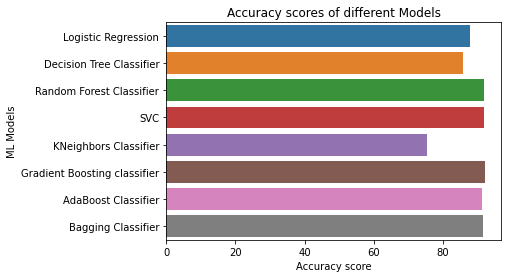

In [182]:
# Checking the accuracy of models

score_lr= 87.83783783783784
score_dt= 85.8108108108108
score_rf= 91.8918918918919
score_svc= 91.8918918918919
score_knc= 75.33783783783784

score_gb= 92.22972972972973
score_ada= 91.21621621621621
score_bag= 91.55405405405406


acc_result=[score_lr,score_dt,score_rf,score_svc,score_knn,score_gb,score_ada,score_bag]
acc_results = pd.DataFrame({"Accuracy Scores":acc_result, "ML Models":[ "Logistic Regression",
            "Decision Tree Classifier","Random Forest Classifier", "SVC","KNeighbors Classifier",
            "Gradient Boosting classifier","AdaBoost Classifier", "Bagging Classifier"]})

g = sns.barplot("Accuracy Scores", "ML Models", data = acc_results)
g.set_xlabel("Accuracy score")
g.set_title("Accuracy scores of different Models")

In [183]:
# Checking the cvscore of models

cvscore_lr= 79.93243243243245
cvscore_dt= 80.60810810810813
cvscore_rf= 86.0810810810811
cvscore_svc= 86.62162162162161
cvscore_knc= 86.21621621621621

cvscore_gb= 86.0135135135135
cvscore_ada= 86.0135135135135
cvscore_bag= 86.4189189189189

Text(0.5, 1.0, 'Cross Validation Scores')

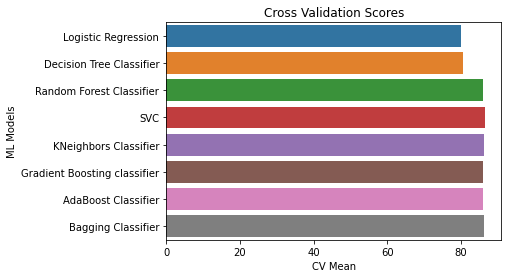

In [184]:
cv_result=[cvscore_lr,cvscore_dt,cvscore_rf,cvscore_svc,cvscore_knc,cvscore_gb,cvscore_ada,cvscore_bag]
cv_results = pd.DataFrame({"Cross Validation Means":cv_result, "ML Models":[ "Logistic Regression",
            "Decision Tree Classifier","Random Forest Classifier", "SVC","KNeighbors Classifier",
            "Gradient Boosting classifier","AdaBoost Classifier", "Bagging Classifier"]})

g = sns.barplot("Cross Validation Means", "ML Models", data = cv_results)
g.set_xlabel("CV Mean")
g.set_title("Cross Validation Scores")

In [172]:
# Let us now check the AUC and ROC

In [173]:
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import plot_roc_curve

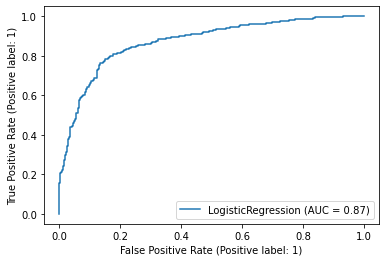

In [174]:
disp= plot_roc_curve(lr, X_train, y_train)

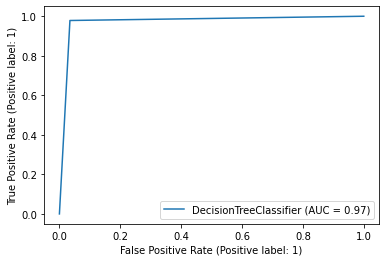

In [175]:
disp= plot_roc_curve(dt, X_train, y_train)

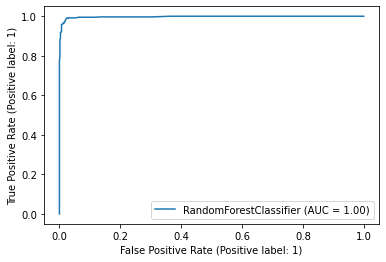

In [176]:
disp= plot_roc_curve(rf, X_train, y_train)

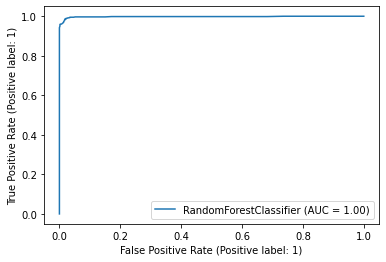

In [177]:
disp= plot_roc_curve(svc, X_train, y_train)

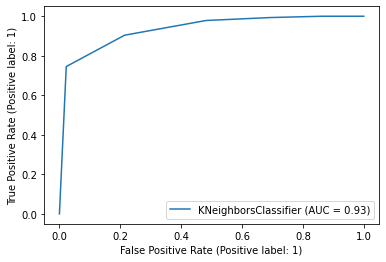

In [178]:
disp= plot_roc_curve(knc, X_train, y_train)

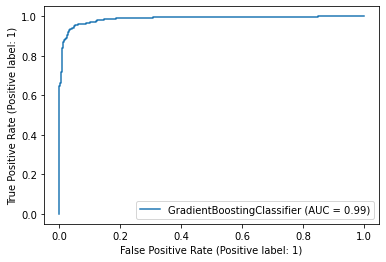

In [179]:
disp= plot_roc_curve(gb, X_train, y_train)

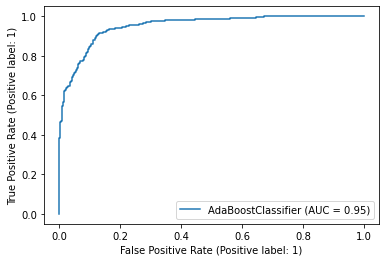

In [180]:
disp= plot_roc_curve(ada, X_train, y_train)

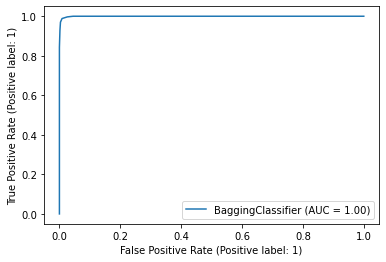

In [181]:
disp= plot_roc_curve(bag, X_train, y_train)

In [ ]:
# considering all the above models, we can conclude Random Forest and Support Vector Classifier are the best model for our problem.
# Let us proceed with this models...

In [185]:
# Random Forest

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 86)

# Training the model
rf.fit(X_train, y_train)
    
# Predicting Y_test
pred = rf.predict(X_test)
    
# Accuracy Score
acc_score = (accuracy_score(y_test, pred))*100
print("Accuracy Score:", acc_score)
    
# Classification Report
class_report = classification_report(y_test, pred)
print("\nClassification Report:\n", class_report)
    
# Cross Validation Score
cv_score = (cross_val_score(rf, X, y, cv=5).mean())*100
print("Cross Validation Score:", cv_score)
    
# Result of accuracy minus cv scores
result = acc_score - cv_score
print("\nAccuracy Score - Cross Validation Score is", abs(result))

Accuracy Score: 90.87837837837837

Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.91      0.91       158
           1       0.90      0.91      0.90       138

    accuracy                           0.91       296
   macro avg       0.91      0.91      0.91       296
weighted avg       0.91      0.91      0.91       296

Cross Validation Score: 87.0945945945946

Accuracy Score - Cross Validation Score is 3.7837837837837753


In [186]:
# SVC

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 2)

# Training the model
svc.fit(X_train, y_train)
    
# Predicting Y_test
pred = svc.predict(X_test)
    
# Accuracy Score
acc_score = (accuracy_score(y_test, pred))*100
print("Accuracy Score:", acc_score)
    
# Classification Report
class_report = classification_report(y_test, pred)
print("\nClassification Report:\n", class_report)
    
# Cross Validation Score
cv_score = (cross_val_score(svc, X, y, cv=5).mean())*100
print("Cross Validation Score:", cv_score)
    
# Result of accuracy minus cv scores
result = acc_score - cv_score
print("\nAccuracy Score - Cross Validation Score is", result)

Accuracy Score: 91.55405405405406

Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.89      0.91       147
           1       0.90      0.94      0.92       149

    accuracy                           0.92       296
   macro avg       0.92      0.92      0.92       296
weighted avg       0.92      0.92      0.92       296

Cross Validation Score: 86.0135135135135

Accuracy Score - Cross Validation Score is 5.540540540540562


In [188]:
# Hyperparameter tuning

from sklearn.model_selection import GridSearchCV

In [189]:
# Random forest

from sklearn.ensemble import RandomForestClassifier

params={"max_features": [1,3,10],
        "min_samples_split":[2,3,5,10],
        "min_samples_leaf":[1,3,10],
        "bootstrap":[False],
        "n_estimators":[200,300],
        "criterion":["gini",'entropy']}

rf2= RandomForestClassifier()

rfgrid=GridSearchCV(estimator= rf2,param_grid=params,scoring='accuracy',cv=5)
rfgrid.fit(X_train,y_train)  
      
print(rfgrid.best_params_)

{'bootstrap': False, 'criterion': 'gini', 'max_features': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}


In [190]:
rf2= RandomForestClassifier(bootstrap= False, criterion= 'gini', max_features= 10, 
                            min_samples_leaf= 1, min_samples_split= 2, n_estimators= 300)
rf2.fit(X_train, y_train)
rf2.score(X_train, y_train)
pred_decision= rf2.predict(X_test)

# Accuracy Score
acc_score = (accuracy_score(y_test, pred_decision))*100
print("Accuracy Score:", acc_score)
    
# Classification Report
class_report = classification_report(y_test, pred_decision)
print("\nClassification Report:\n", class_report)
    
# Cross Validation Score
cv_score = (cross_val_score(rf2, X, y, cv=5).mean())*100
print("Cross Validation Score:", cv_score)
    
# Result of accuracy minus cv scores
result = acc_score - cv_score
print("\nAccuracy Score - Cross Validation Score is", abs(result))

Accuracy Score: 91.21621621621621

Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.92      0.92       161
           1       0.90      0.90      0.90       135

    accuracy                           0.91       296
   macro avg       0.91      0.91      0.91       296
weighted avg       0.91      0.91      0.91       296

Cross Validation Score: 86.4189189189189

Accuracy Score - Cross Validation Score is 4.797297297297305


In [ ]:
# Accuracy slightly increased!

In [191]:
# SVC

params={'C': [0.1, 1, 10, 100, 1000], 'gamma': [1, 0.1, 0.01, 0.001, 0.0001],'kernel': ['rbf']}

svc2= SVC()

svcgrid=GridSearchCV(svc2,param_grid=params,cv=4)
svcgrid.fit(X_train,y_train)  
      
print(svcgrid.best_params_)

{'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}


In [196]:
svc2= SVC(C= 10, gamma= 0.1, kernel= 'rbf')
svc2.fit(X_train, y_train)
svc2.score(X_train, y_train)
pred_decision= svc2.predict(X_test)

# Accuracy Score
acc_score = (accuracy_score(y_test, pred_decision))*100
print("Accuracy Score:", acc_score)
    
# Classification Report
class_report = classification_report(y_test, pred_decision)
print("\nClassification Report:\n", class_report)
    
# Cross Validation Score
cv_score = (cross_val_score(svc2, X, y, cv=5).mean())*100
print("Cross Validation Score:", cv_score)
    
# Result of accuracy minus cv scores
result = acc_score - cv_score
print("\nAccuracy Score - Cross Validation Score is", result)

Accuracy Score: 95.27027027027027

Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.99      0.96       161
           1       0.99      0.90      0.95       135

    accuracy                           0.95       296
   macro avg       0.96      0.95      0.95       296
weighted avg       0.96      0.95      0.95       296

Cross Validation Score: 92.63513513513514

Accuracy Score - Cross Validation Score is 2.6351351351351298


In [197]:
# Much increase in accuracy and performance!
# So we choose SVC as our final model...

In [198]:
# Conclusion

In [199]:
import pickle
filename= 'churn.pkl'
pickle.dump(svc2, open(filename, 'wb'))

In [200]:
[]

[]

In [201]:
loaded_model=pickle.load(open('churn.pkl','rb'))
result= loaded_model.score(X_test, y_test)
print(result*100)

95.27027027027027


In [202]:
conclusion= pd.DataFrame([loaded_model.predict(X_test)[:],pred_decision[:]], index=['Predicted','Original'])

In [203]:
conclusion

,0,1,2,3,4,5,6,7,8,9,...,286,287,288,289,290,291,292,293,294,295
Predicted,0,1,0,0,0,1,0,0,1,0,...,1,0,0,1,0,1,0,0,0,0
Original,0,1,0,0,0,1,0,0,1,0,...,1,0,0,1,0,1,0,0,0,0


# Conclusion

The accuracy score for prediction of "insurance claim is fraudulent or not" is 95%